In [374]:
# Import relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


import torch
import torch.nn as nn
from torch.utils.data import DataLoader,TensorDataset
from torchvision import transforms
import torchvision.models as models

In [375]:
# device config
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

In [376]:
X = np.load("images.npy") # read images
Y = pd.read_csv("counts.csv") # read the csv file
F = np.loadtxt('split.txt') # read cell counts

## Q1i)

In [377]:
# split into train,test and validation sets, fold 1 is the train set,fold 2 is the validation set and fold 3 is the test set
X_train = X[F==1]
X_val = X[F==2]
X_test = X[F==3]


In [378]:
Y['total_cell_counts'] = Y.sum(axis=1) # add a column to the dataframe that contains the sum of the counts of each row

In [379]:
Y

,neutrophil,epithelial,lymphocyte,plasma,eosinophil,connective,total_cell_counts
0,0,117,0,0,0,0,117
1,0,95,1,0,0,8,104
2,0,172,3,0,0,2,177
3,0,56,0,0,0,10,66
4,0,169,7,0,0,0,176
...,...,...,...,...,...,...,...
4976,0,22,17,8,2,50,99
4977,0,78,9,0,0,9,96
4978,0,106,1,0,0,0,107
4979,0,80,8,1,0,14,103


In [380]:
# number of examples with 3 folds
n1 = ((F == 1).sum())
n2 = ((F == 2).sum())
n3 = ((F == 3).sum())
print("Number of examples for fold 1: ", n1)
print("Number of examples for fold 2: ", n2)
print("Number of examples for fold 3: ", n3)
print("Total number of examples: ", n1+n2+n3)

Number of examples for fold 1:  1622
Number of examples for fold 2:  1751
Number of examples for fold 3:  1608
Total number of examples:  4981


## Q1ii)

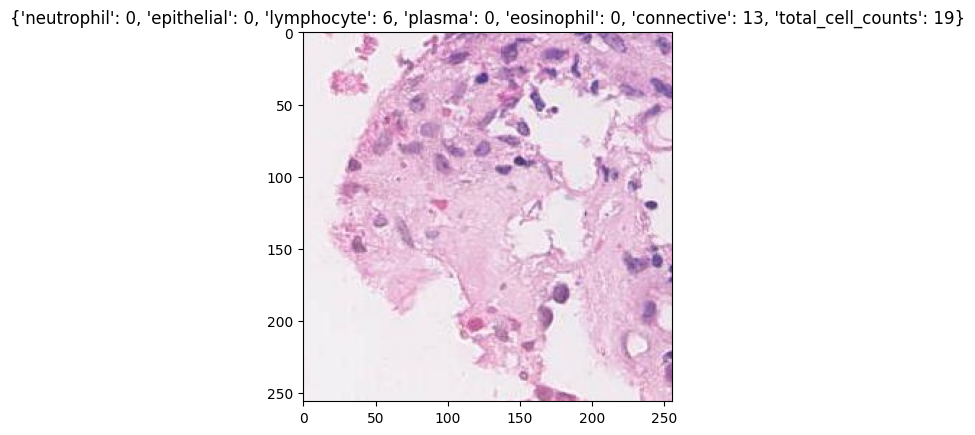

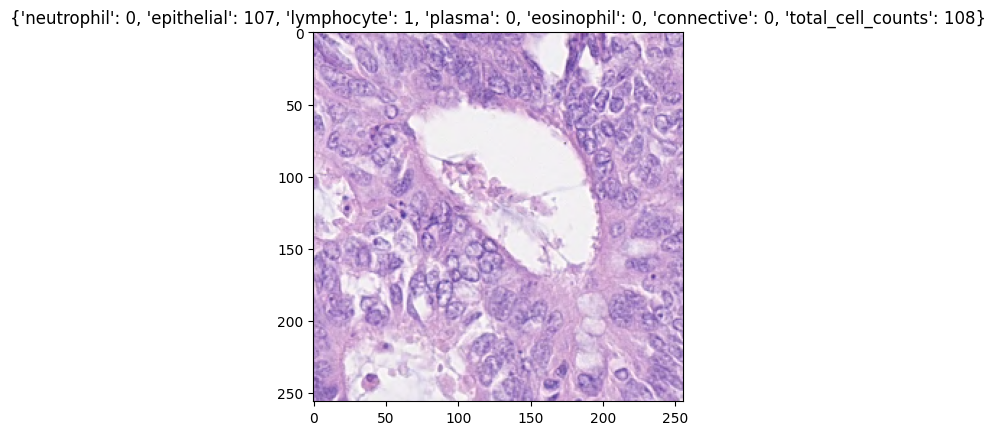

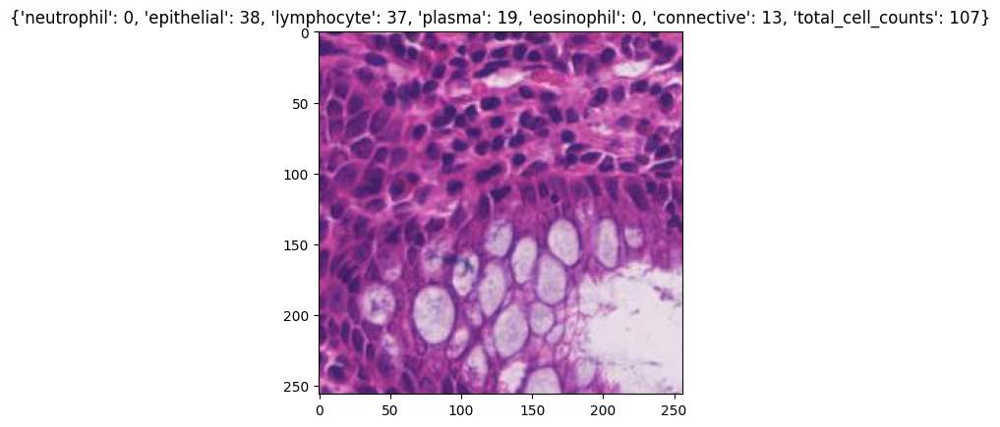

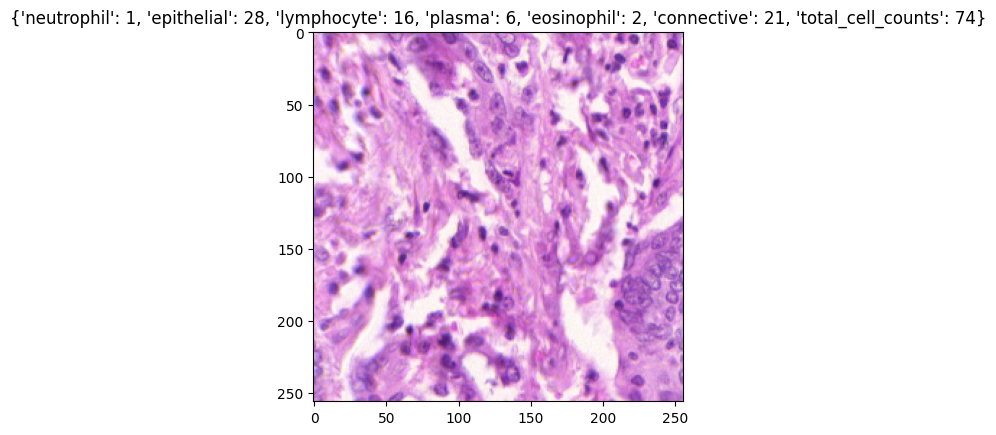

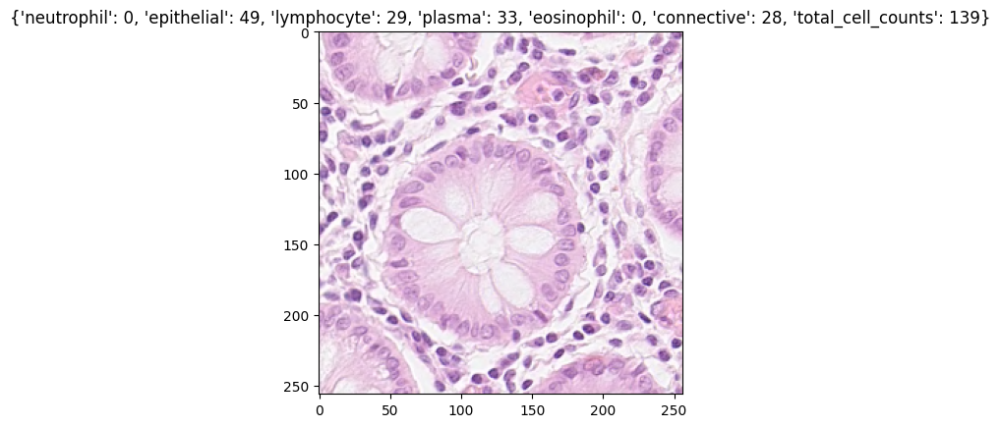

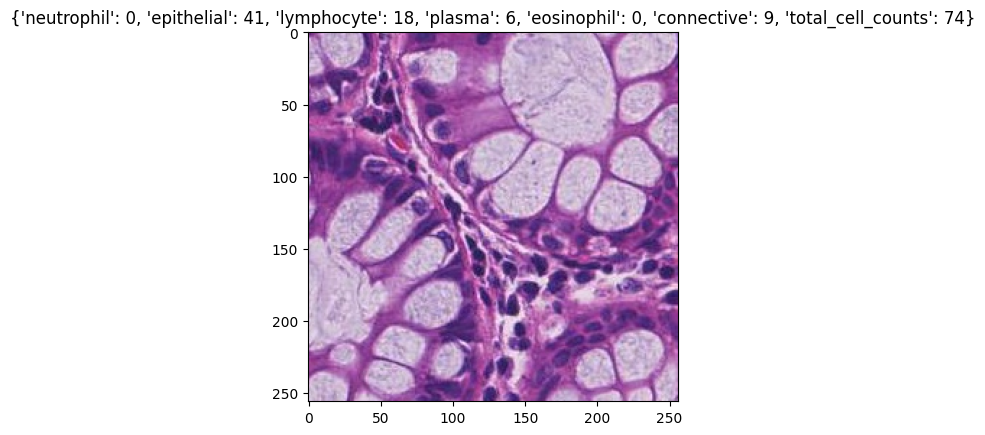

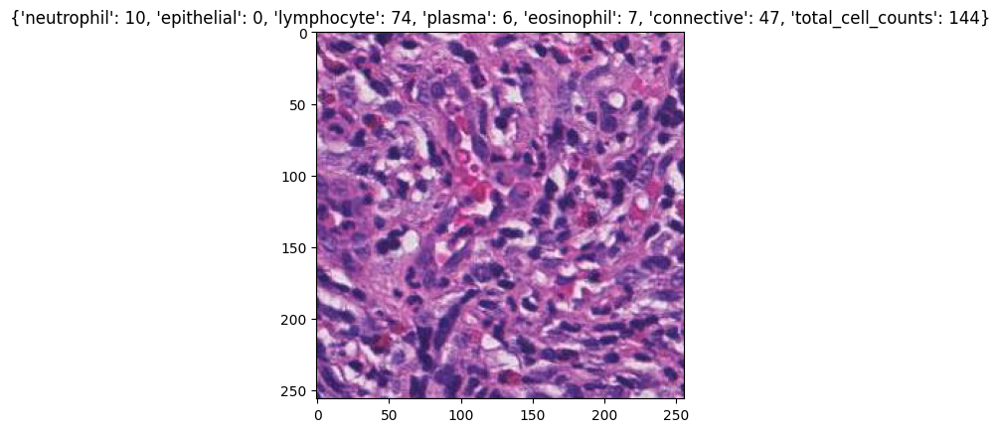

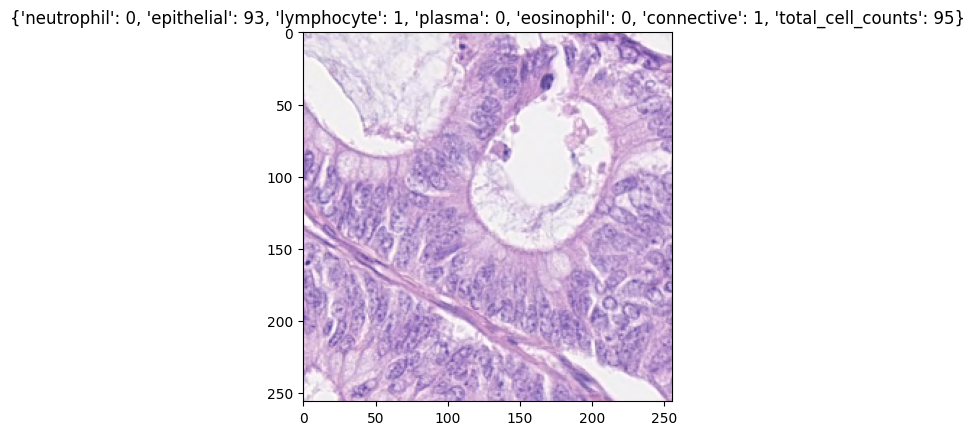

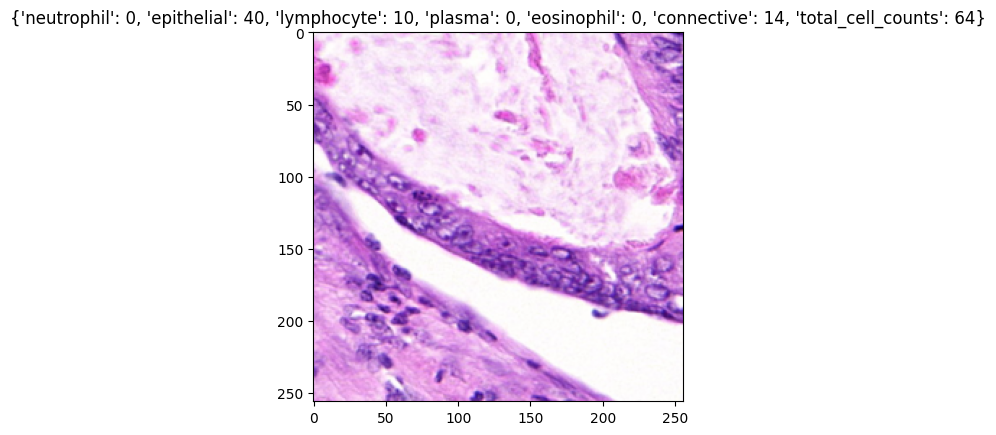

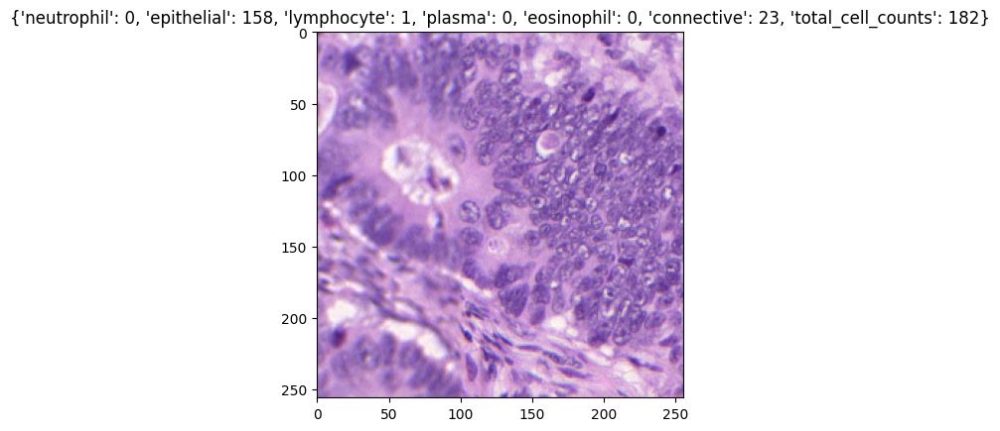

In [381]:
# Plot random image examples with their cell counts
for i in range(10):
    n = np.random.randint(0, X.shape[0])
    plt.imshow(X[n])
    plt.title(Y.loc[n].to_dict())
    plt.show()

Observations
 - Long black structures are the T3 cells 

## Q1iii)

array([[<Axes: title={'center': 'neutrophil'}>,
        <Axes: title={'center': 'epithelial'}>,
        <Axes: title={'center': 'lymphocyte'}>],
       [<Axes: title={'center': 'plasma'}>,
        <Axes: title={'center': 'eosinophil'}>,
        <Axes: title={'center': 'connective'}>],
       [<Axes: title={'center': 'total_cell_counts'}>, <Axes: >,
        <Axes: >]], dtype=object)

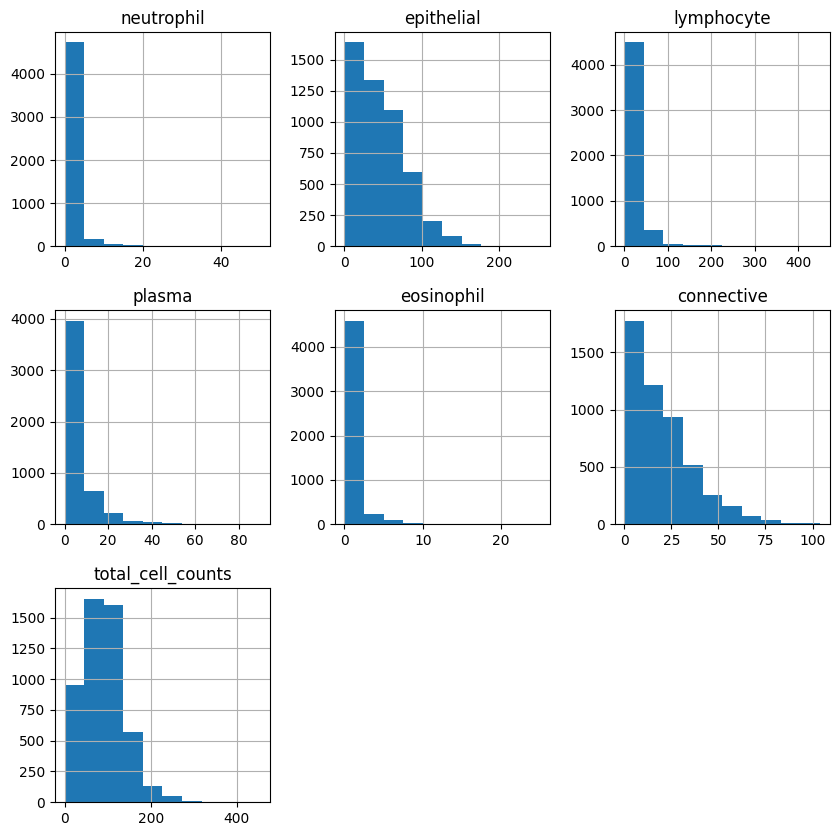

In [382]:
# The histogram of counts of each cell type
Y.hist(figsize=(10,10))

Number of examples with cell counts between  0 :  150
Number of examples with cell counts between  1-5 :  37
Number of examples with cell counts between  6-10 :  24
Number of examples with cell counts between  11-20 :  81
Number of examples with cell counts between  21-30 :  77
Number of examples with cell counts between  31-40 :  82
Number of examples with cell counts between  41-50 :  82
Number of examples with cell counts between  50+ :  4448


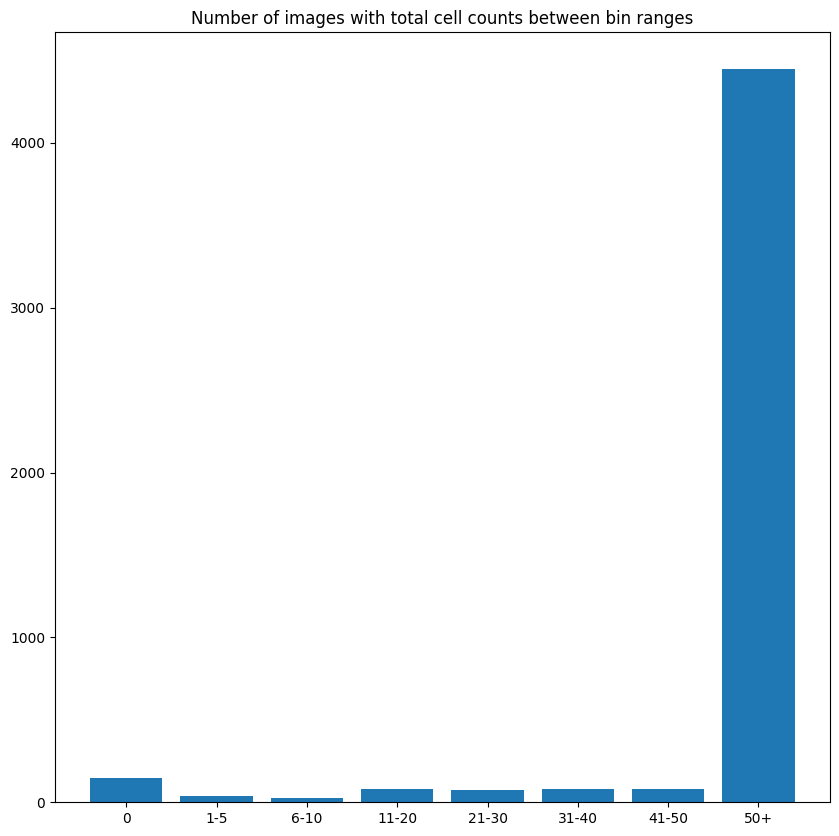

In [383]:
# The histogram of counts of each cell type

sums = Y.sum(axis=1)
# How many values are zero
zeros = (sums == 0).sum()

# Values between 1-5
one_five = ((sums > 0) & (sums < 6)).sum()

# Values between 6-10
six_ten = ((sums > 5) & (sums < 11)).sum()

# Values between 11-20
eleven_twenty = ((sums > 10) & (sums < 21)).sum()

# Values between 21-30
twenty_one_thirty = ((sums > 20) & (sums < 31)).sum()

# Values between 31-40
thirty_one_forty = ((sums > 30) & (sums < 41)).sum()

# Values between 41-50
forty_one_fifty = ((sums > 40) & (sums < 51)).sum()

# Values above 50
fifty_plus = (sums > 50).sum()

y = [zeros,one_five, six_ten, eleven_twenty, twenty_one_thirty, thirty_one_forty, forty_one_fifty, fifty_plus]
x = ["0","1-5","6-10","11-20","21-30","31-40","41-50","50+"]
# Plot the histogram
plt.figure(figsize=(10,10))
plt.bar(x, y)
plt.title("Number of images with total cell counts between bin ranges")

# print the number of examples in each bin with a for loop
for i,j in enumerate(y):
    print("Number of examples with cell counts between ", x[i], ": ", j)

## Q1iv

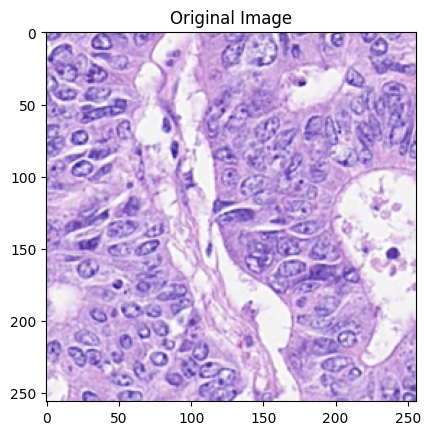

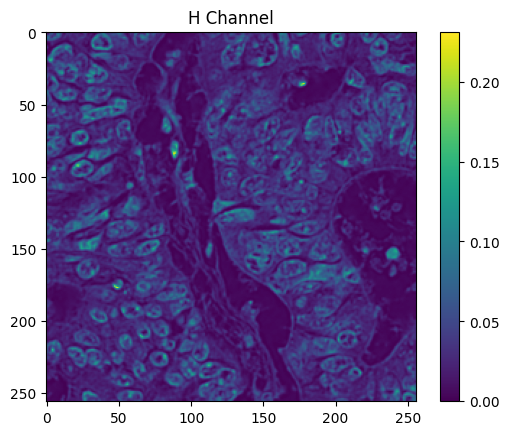

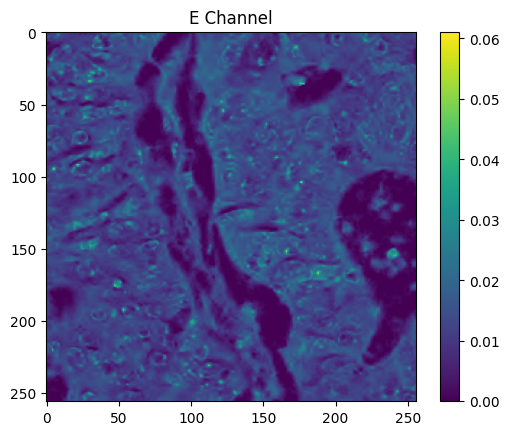

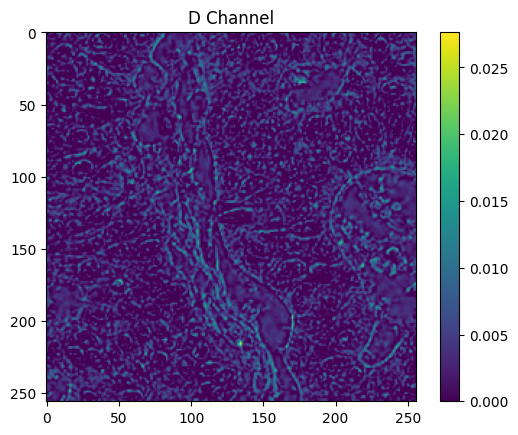

In [384]:
from skimage.color import rgb2hed,hed2rgb
I = X[0]/255.0 #read sample image and rescale pixel range in it 
I_hed =  rgb2hed(I) #convert to HED 
plt.imshow(I);plt.title('Original Image');plt.show() 
I_h = I_hed[:,:,0]; plt.figure(); plt.imshow(I_h);plt.colorbar();plt.title('H Channel');plt.show() 
I_e = I_hed[:,:,1]; plt.figure();  plt.imshow(I_e);plt.colorbar();plt.title('E Channel');plt.show() 
I_d = I_hed[:,:,2]; plt.figure();  plt.imshow(I_d);plt.colorbar();plt.title('D Channel');plt.show()

In [385]:
def rgb_to_hed(rgb_img,text):
    hed = rgb2hed(rgb_img)

    # Create an RGB image for each of the stains
    null = np.zeros_like(hed[:, :, 0])
    ihc_h = hed2rgb(np.stack((hed[:, :, 0], null, null), axis=-1))
    ihc_e = hed2rgb(np.stack((null, hed[:, :, 1], null), axis=-1))
    ihc_d = hed2rgb(np.stack((null, null, hed[:, :, 2]), axis=-1))

    # Display
    fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(rgb_img)
    ax[0].set_title("Original image")

    ax[1].imshow(ihc_h)
    ax[1].set_title("Hematoxylin")

    ax[2].imshow(ihc_e)
    ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

    ax[3].imshow(ihc_d)
    ax[3].set_title("DAB")
    #set title
    fig.suptitle(text, fontsize=9)

    for a in ax.ravel():
        a.axis('off')

    fig.tight_layout()

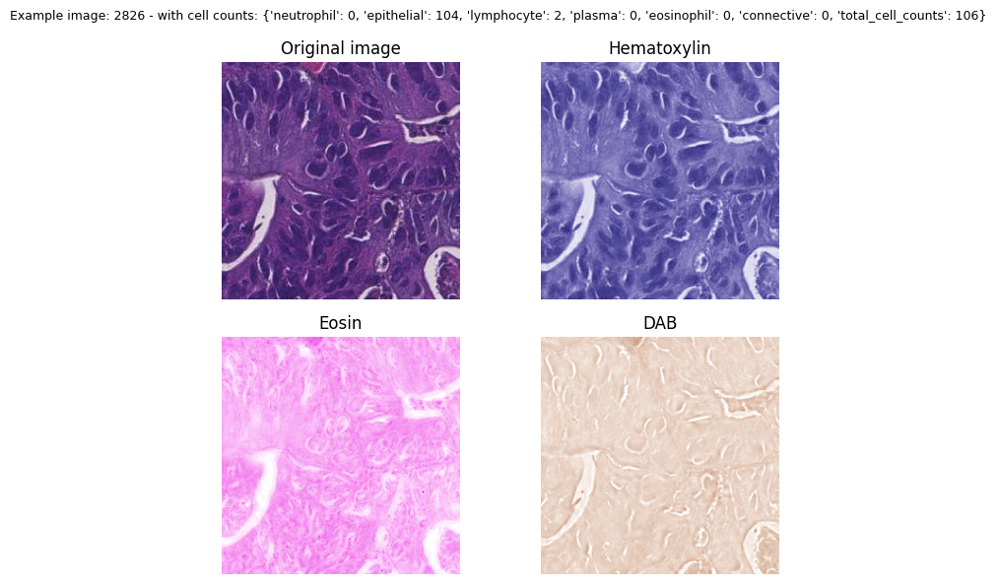

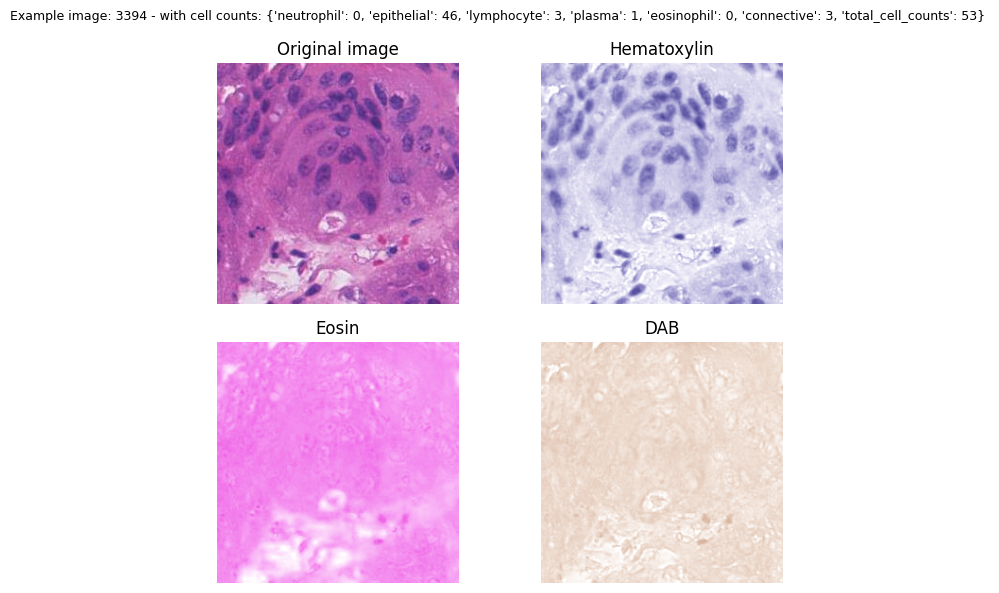

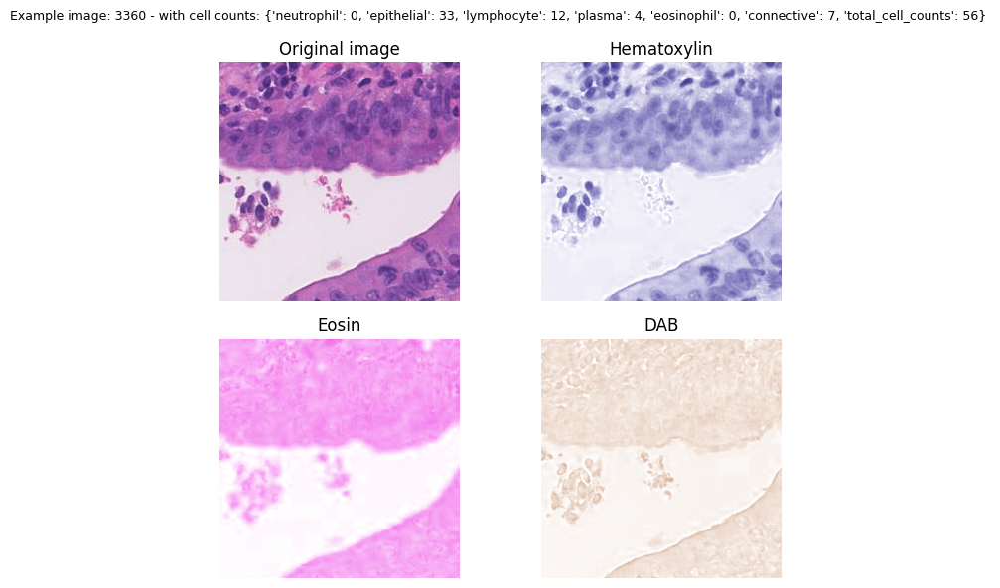

In [386]:
# Plot random image example in HED
for i in range(3):
    n = np.random.randint(0, X.shape[0])
    text = (f"Example image: {n} - with cell counts: {Y.loc[n].to_dict()} ")
    rgb_to_hed(X[n],text)

## Q1v)

In [387]:
# average of the H channel for each image
H_mean = np.array([np.mean(rgb2hed(X[i])[:,:,0]) for i in range(X.shape[0])])

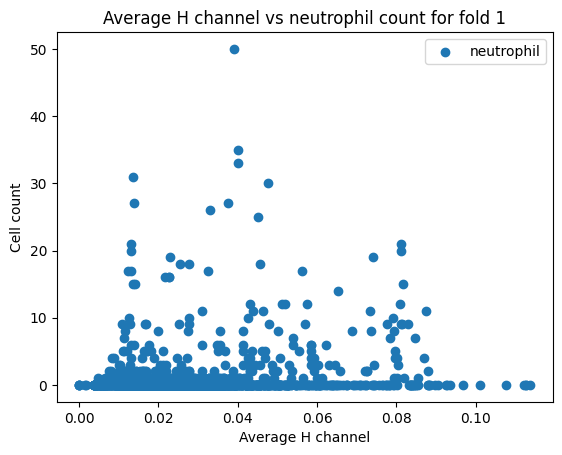

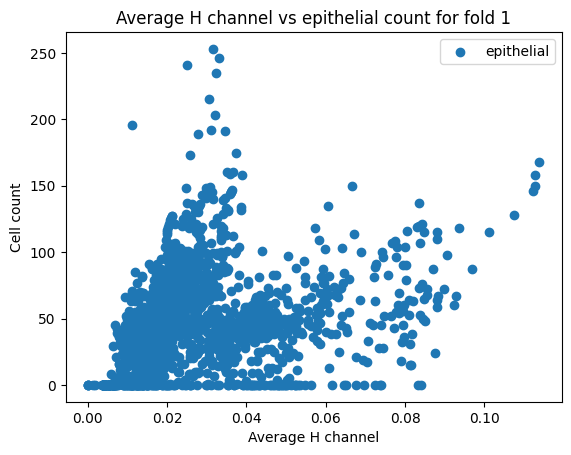

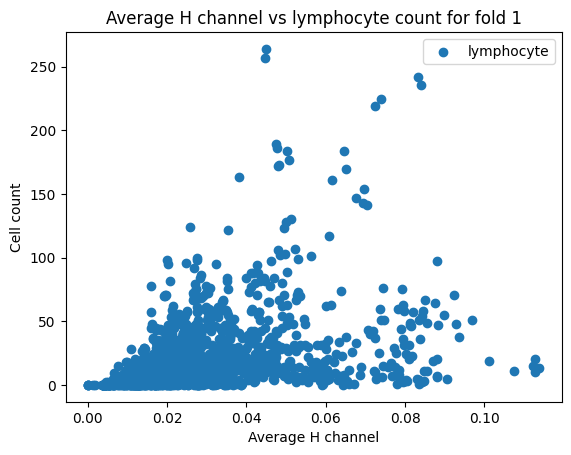

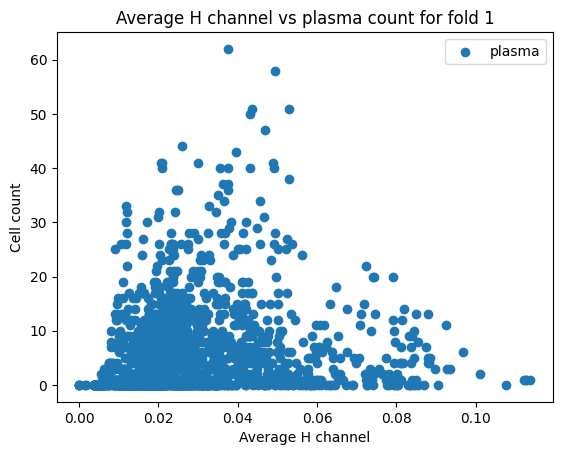

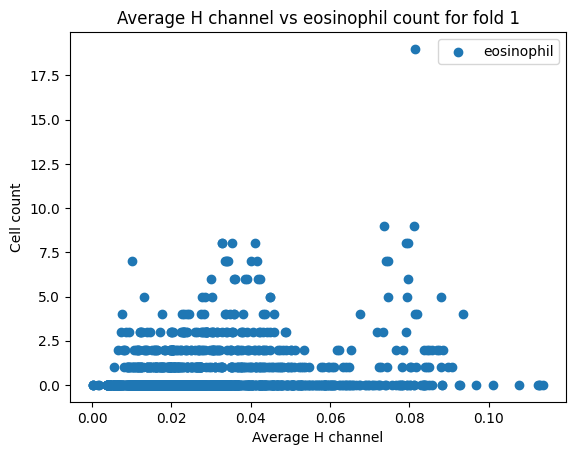

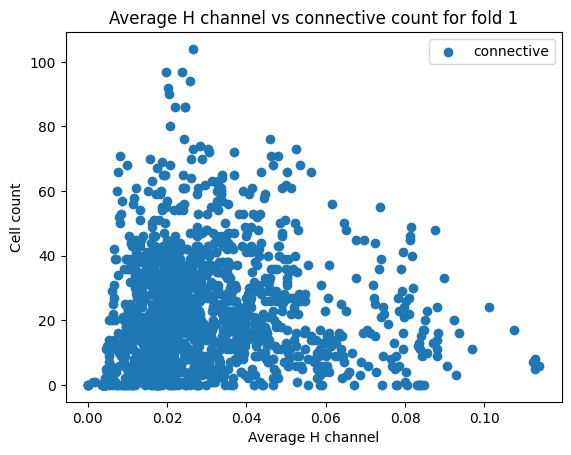

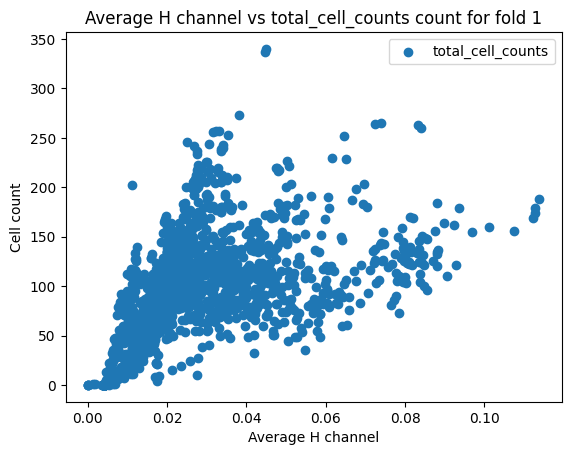

In [388]:
# plot the scatter plot of the average H channel vs each cell count for fold 1
for i in range(0,7):
    plt.scatter(H_mean[F==1],Y.iloc[:,i][F==1],label=Y.columns[i])
    plt.legend()
    plt.xlabel("Average H channel")
    plt.ylabel("Cell count")
    plt.title(f"Average H channel vs {Y.columns[i]} count for fold 1")
    plt.show()


Observations
- There is weak correlations between the H channel and each cell type 
- The exceptions are the total cell counts and counts of Lymphocytes

## Q1vi)

Metrics:
- R2 is a good metric as it will show the correlation between the predicted count and true count and it will indicate the level of variance explained by the model
- Mean squared error is good for this task as it will penalise larger errors more
- Depends on what we care about the most, if it is to reduce false positives MSE is better but if it just to explain the variance then R2 is better

    

## Q2i)
PCA

In [389]:
# do pca on the H,RG,B channels
from sklearn.decomposition import PCA
# get the H channel for each image
H = np.array([rgb2hed(X[i])[:,:,0] for i in range(X.shape[0])])


In [390]:
# scale the pixels to be between 0 and 1
X_scaled = X/255.0
# get the R,G,B channels for each image
R = X_scaled[:,:,:,0]
G = X_scaled[:,:,:,1]
B = X_scaled[:,:,:,2]

In [391]:
#split into 2 arrays one for training and one for validation,testing

#train arrays
H_train = H[F==1]
R_train = R[F==1]
G_train = G[F==1]
B_train = B[F==1]

#validation and test arrays
H_val_test = np.concatenate((H[F==2],H[F==3]))
R_val_test = np.concatenate((R[F==2],R[F==3]))
G_val_test = np.concatenate((G[F==2],G[F==3]))
B_val_test = np.concatenate((B[F==2],B[F==3]))

# reshape the arrays to be 2D
H_train = H_train.reshape(H_train.shape[0],-1)
R_train = R_train.reshape(R_train.shape[0],-1)
G_train = G_train.reshape(G_train.shape[0],-1)
B_train = B_train.reshape(B_train.shape[0],-1)

In [392]:
# use PCA to reduce the dimensionality of the data
pca_H = PCA(n_components=0.95)
pca_R = PCA(n_components=0.95)
pca_G = PCA(n_components=0.95)
pca_B = PCA(n_components=0.95)

H_train_pca = pca_H.fit_transform(H_train)
R_train_pca = pca_R.fit_transform(R_train)
G_train_pca = pca_G.fit_transform(G_train)
B_train_pca = pca_B.fit_transform(B_train)

In [393]:
# apply the same transformation to the validation and test data
H_val_test_pca = pca_H.transform(H_val_test.reshape(H_val_test.shape[0],-1))
R_val_test_pca = pca_R.transform(R_val_test.reshape(R_val_test.shape[0],-1))
G_val_test_pca = pca_G.transform(G_val_test.reshape(G_val_test.shape[0],-1))
B_val_test_pca = pca_B.transform(B_val_test.reshape(B_val_test.shape[0],-1))

# 4981 x 862 cpts
H_pca = np.concatenate((H_train_pca,H_val_test_pca),axis=0)
# 4981 x 969 cpts
R_pca = np.concatenate((R_train_pca,R_val_test_pca),axis=0)
# 4981 x 787 cpts
G_pca = np.concatenate((G_train_pca,G_val_test_pca),axis=0)
# 4981 x 1010 cpts
B_pca = np.concatenate((B_train_pca,B_val_test_pca),axis=0)

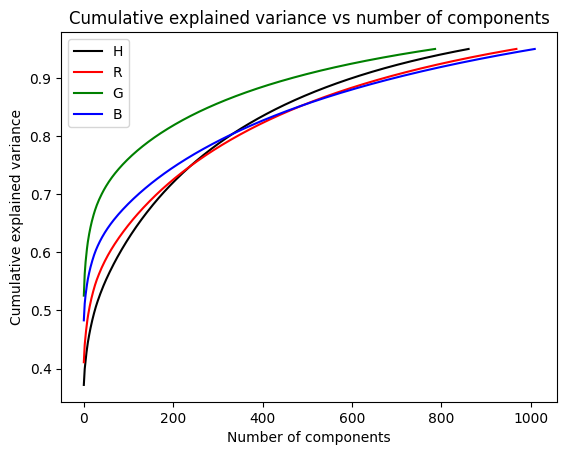

In [394]:
# plot the explained variance ratio for each pca channel
plt.plot(np.cumsum(pca_H.explained_variance_ratio_),color="black",label="H")
plt.plot(np.cumsum(pca_R.explained_variance_ratio_),color="red",label="R")
plt.plot(np.cumsum(pca_G.explained_variance_ratio_),color="green",label="G")
plt.plot(np.cumsum(pca_B.explained_variance_ratio_),color="blue",label="B")
plt.legend(["H","R","G","B"])
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.title("Cumulative explained variance vs number of components")
plt.show()

Mean of each channel

In [395]:
# calculate the mean for each channel from the PCA transformed data
H_mean = np.mean(H_pca,axis=1)
R_mean = np.mean(R_pca,axis=1)
G_mean = np.mean(G_pca,axis=1)
B_mean = np.mean(B_pca,axis=1)


## Q2ib)

Variance of each channel

In [396]:
# calculate the variance for each channel from the PCA transformed data
H_var = np.var(H_pca,axis=1)
R_var = np.var(R_pca,axis=1)
G_var = np.var(G_pca,axis=1)
B_var = np.var(B_pca,axis=1)

In [397]:
# create a dataframe with the mean and variance for each channel and the total cell count
features_df = pd.DataFrame({'H_mean':H_mean,'R_mean':R_mean,'G_mean':G_mean,'B_mean':B_mean,'H_var':H_var,'R_var':R_var,'G_var':G_var,'B_var':B_var,'total_cell_counts':Y['total_cell_counts']})



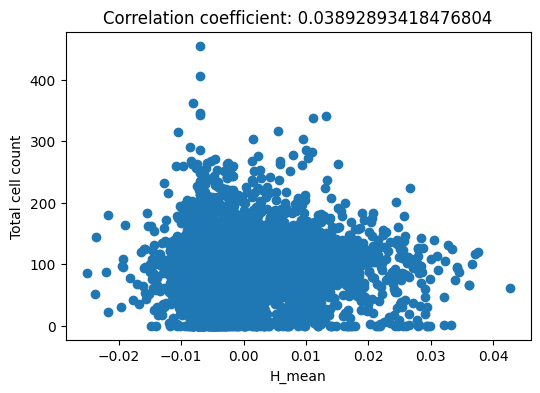

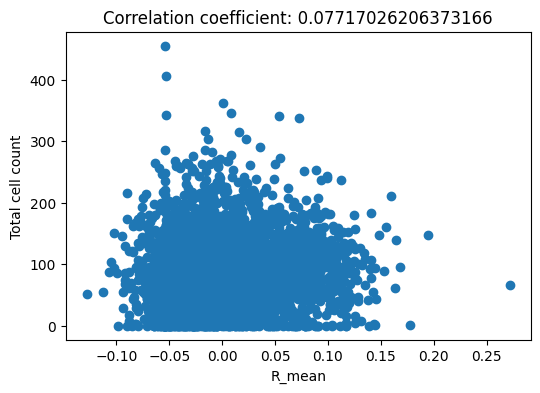

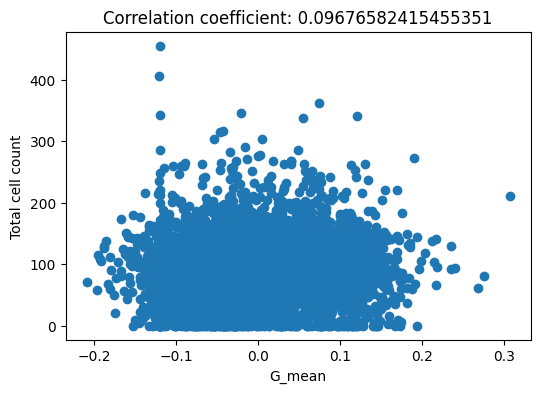

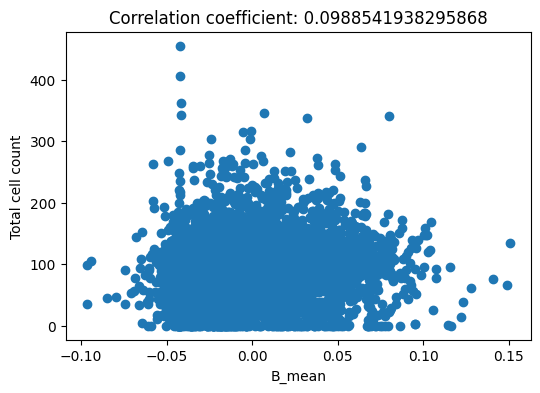

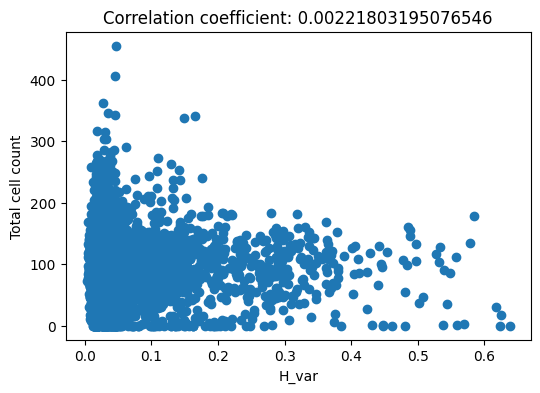

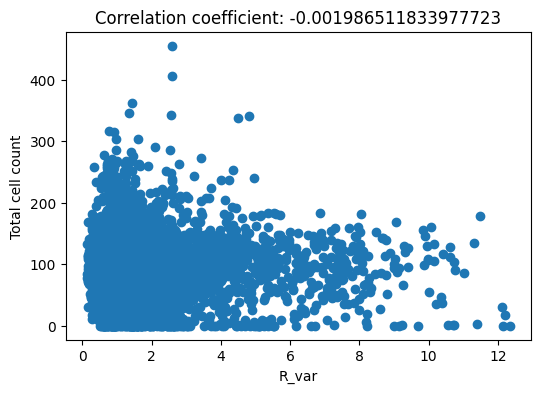

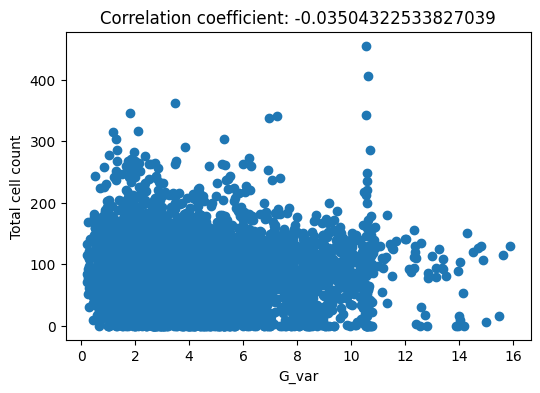

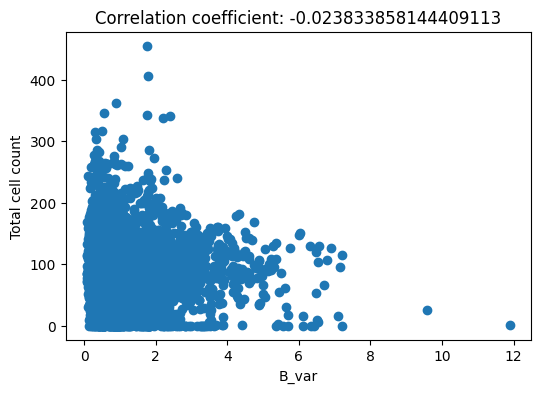

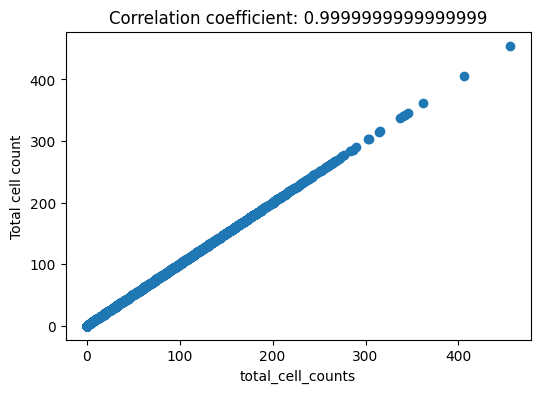

In [398]:
# scatter plot of each feature against the total cell count and the correlation coefficient

for feature in features_df.columns:
    plt.figure(figsize=(6,4))
    plt.scatter(features_df[feature],features_df['total_cell_counts'])
    plt.xlabel(feature)
    plt.ylabel("Total cell count")
    plt.title("Correlation coefficient: "+str(np.corrcoef(features_df[feature],features_df['total_cell_counts'])[0,1]))
    plt.show()

## Q2ii

In [399]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

def plot_scores(ytrain,Y_pred,title):
    # scatter plot of the predicted total cell count against the actual total cell count
    plt.figure(figsize=(6,4))
    plt.scatter(Y_pred,ytrain)
    #plot the line y=x
    plt.plot([0, 1e6], [0, 1e6], transform=plt.gca().transAxes, ls="--", c=".3")
    plt.xlabel("Predicted total cell count")
    plt.ylabel("Actual total cell count")
    plt.title("OLS regression")
    plt.show()


    #RMSE
    print(f"RMSE: {(np.sqrt(mean_squared_error(ytrain,Y_pred)))}")
    #Pearson Correlation Coefficient
    print(f"Pearson Correlation Coefficient: {(np.corrcoef(ytrain,Y_pred)[0,1])}")
    #Spearman Correlation Coefficient
    print(f"Spearman Correlation Coefficient: {(stats.spearmanr(ytrain,Y_pred)[0])}")
    #R2 score

    print(f"R squared: {r2_score(ytrain, Y_pred)}")

In [400]:
xtrain = features_df.values[:,:-1][F==1]
xtest = features_df.values[:,:-1][F==2]
xval = features_df.values[:,:-1][F==3]

ytrain = features_df['total_cell_counts'][F==1]
ytest = features_df['total_cell_counts'][F==2]
yval = features_df['total_cell_counts'][F==3]

OLS

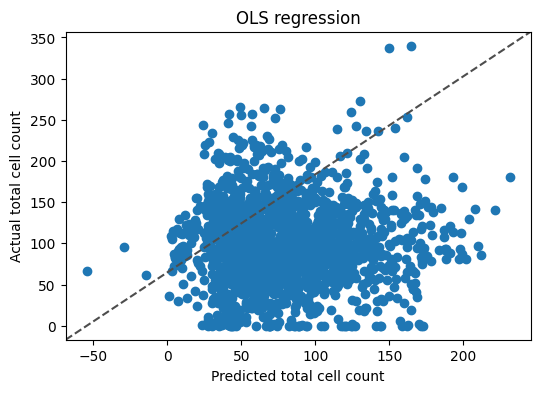

RMSE: 67.07500193354784
Pearson Correlation Coefficient: 0.011802534955736476
Spearman Correlation Coefficient: 0.0009198210218849679
R squared: -0.765846112971621


In [401]:
#Ordinary Least Squares (OLS) regression
# create a linear regression object
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
# import stats from scipy
from scipy import stats


regr = linear_model.LinearRegression(fit_intercept=False)

# train the model using the training PCA transformed data all features apart from the total cell count
regr.fit(xtrain, ytrain)
# make predictions on the test data
Y_pred = regr.predict(xtrain)

plot_scores(ytrain,Y_pred,"OLS regression")

MLP

Iteration 1, loss = 4655.78530887
Iteration 2, loss = 4618.72392717
Iteration 3, loss = 4583.22380572
Iteration 4, loss = 4546.80730863
Iteration 5, loss = 4510.57451511
Iteration 6, loss = 4471.91593187
Iteration 7, loss = 4428.53708766
Iteration 8, loss = 4376.08811258
Iteration 9, loss = 4311.74918857
Iteration 10, loss = 4233.84651433
Iteration 11, loss = 4136.62881576
Iteration 12, loss = 4021.42275983
Iteration 13, loss = 3884.53040444
Iteration 14, loss = 3726.82088258
Iteration 15, loss = 3541.69028034
Iteration 16, loss = 3340.57082305
Iteration 17, loss = 3123.52986448
Iteration 18, loss = 2902.07186841
Iteration 19, loss = 2683.52931884
Iteration 20, loss = 2488.15758253
Iteration 21, loss = 2317.24557270
Iteration 22, loss = 2186.52428531
Iteration 23, loss = 2097.54911033
Iteration 24, loss = 2036.03932861
Iteration 25, loss = 2008.42627749
Iteration 26, loss = 1991.87782199
Iteration 27, loss = 1979.48991752
Iteration 28, loss = 1967.67484713
Iteration 29, loss = 1954.096

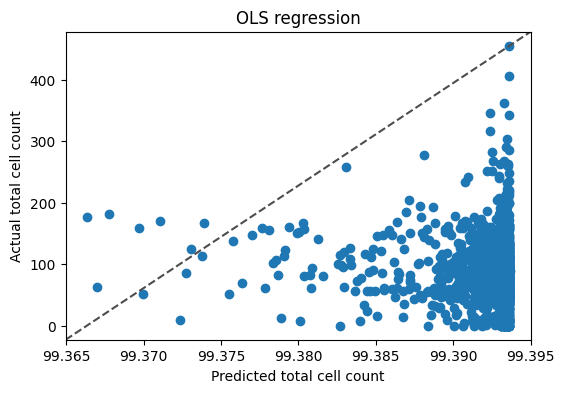

RMSE: 52.08128639906478
Pearson Correlation Coefficient: -0.059855259288196926
Spearman Correlation Coefficient: -0.06841843492877427
R squared: -0.03970221079653835


In [402]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# define the MLP model with initial hyperparameters
mlp = MLPRegressor(hidden_layer_sizes=(100,100,100), max_iter=1000, activation='relu', solver='adam', verbose=True)

# define the hyperparameters to tune
parameters = {'hidden_layer_sizes': [(50, 50), (100, 100), (100, 100, 100)],
              'activation': ['relu', 'tanh', 'logistic'],
              'alpha': [0.0001, 0.001, 0.01]}

# create a GridSearchCV object to tune the hyperparameters using validation set
clf = GridSearchCV(mlp, parameters, cv=5)
clf.fit(xval, yval)

# get the best hyperparameters
best_hidden_layer_sizes = clf.best_params_['hidden_layer_sizes']
best_activation = clf.best_params_['activation']
best_alpha = clf.best_params_['alpha']

# train the MLP model with the best hyperparameters on the training set
mlp = MLPRegressor(hidden_layer_sizes=best_hidden_layer_sizes, max_iter=1000, activation=best_activation, alpha=best_alpha, solver='adam', verbose=True)
mlp.fit(xtrain, ytrain)

# evaluate the performance of the model on the test set
ypred = mlp.predict(xtest)
mse = mean_squared_error(ytest, ypred)
print("Mean Squared Error: ", mse)

plot_scores(ytest, ypred, "MLP regression")

# Q3)

In [266]:
def plot_loss(losses,cell_label =''):
    plt.figure(figsize=(10,5))
    plt.plot(np.arange(1,len(losses)+1),losses,'bo-')
    #plt.plot(np.arange(1,len(valid_losses)+1),valid_losses,'ro-')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Loss vs Epoch for {cell_label}')
    #plt.legend(['Train','Validation'])
    plt.show

In [265]:
def TrainingLoop(name,num_epochs,model,criterion,optimizer,train_loader,valid_loader):
    total_step = len(train_loader)
    min_loss = np.inf

    # tracking loss history
    losses = []
    #valid_losses = []

    print(f"Training model:{name} ")
    for epoch in range(num_epochs):
        running_loss = 0.0
        model = model.train()
        for i, (images, target) in enumerate(train_loader):
            images = images.to(device)
            target = target.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, target)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
    
            if (i+1) % 10 == 0:
                print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                    .format(epoch+1, num_epochs, i+1, total_step, loss.item()))
            # calculate the running loss over the the batch size
            running_loss += loss.item() * images.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        losses.append(epoch_loss)


        # Calculate validation loss
        model = model.eval()
        images,target = next(iter(valid_loader))
        images = images.to(device)
        target = target.to(device)

        outputs = model(images)
        valid_loss = criterion(outputs, target)
        valid_loss = valid_loss.cpu().detach().numpy()

        
        #valid_losses.append(valid_loss)
        print("Validation loss: ", valid_loss)
        # Check if the validation loss is going down 
        if valid_loss < min_loss:
            print("saving model")
            torch.save(model, 'models/{}.pth'.format(name))
            min_loss = valid_loss
    plot_loss(losses,cell_label=name)
        

In [348]:
# create a dataframe to store the results for 3a
total_countsdf = pd.DataFrame(columns =["MSE","R2","RMS","Spearman","Pearson"],index = ["Training","Validation","Test"])
# create a dataframe to store the results for 3b
cells = Y.columns
#dataframe with columns as the cell type and rows as the metrics
test_resultsdf = pd.DataFrame(columns=["MSE","R2","RMS","Spearman","Pearson"],index=cells)
validation_resultsdf = pd.DataFrame(columns=["MSE","R2","RMS","Spearman","Pearson"],index=cells)
train_resultsdf = pd.DataFrame(columns=["MSE","R2","RMS","Spearman","Pearson"],index=cells)


In [299]:
def store_results(row,values):
    total_countsdf.loc[row] = values
    

In [338]:
def store_results2(cell,results,set):
    if set == 'Training':
        train_resultsdf.loc[cell] = results
    elif set == 'Validation':
        validation_resultsdf.loc[cell] = results
    elif set == 'Test':
        test_resultsdf.loc[cell] = results

In [303]:
from scipy import stats
from sklearn.metrics import mean_squared_error, r2_score

def model_evaluation(model,loader,titles,cell_label=''):
    # Test the model
    model.eval()  # eval mode (batchnorm uses moving mean/variance instead of mini-batch mean/variance)

    for i,loader in enumerate(loader):
        print(f"Evaluating {titles[i]} set")

        with torch.no_grad():

            total_preds = []
            total_labels = []
            total_loss = 0.0
            total_batches = 0
            for images, labels in iter(loader):
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images)

                predicted = outputs.detach().cpu().numpy()[:,0]
                labels = labels.detach().cpu().numpy()

                total_preds.append(predicted)
                total_labels.append(labels)

                total_loss += mean_squared_error(labels, predicted)

                total_batches += 1

            mse = total_loss/total_batches

            # make the total predictions and labels into a single array
            total_preds = np.concatenate(total_preds)
            total_labels = np.concatenate(total_labels)
            # make total_labels into a 1d array
            total_labels = total_labels.ravel()

            # calculate the metrics
            R2 =  r2_score(total_preds, total_labels)
            pearson = np.corrcoef(total_preds, total_labels)[0,1]
            RMSE =  np.sqrt(mse)
            spearman = stats.spearmanr(total_preds, total_labels)[0]
            # store the results in the respective dataframe
            metrics = {"MSE":mse,"R2":R2,"RMS":RMSE,"Spearman":spearman,"Pearson":pearson}
            # store the results in the respective dataframe
            if cell_label == 'total_cell_counts':
                store_results(titles[i],metrics)
            else:
                store_results2(cell_label,metrics,titles[i])

            # Plot predcitons
            plt.scatter(total_labels, total_preds)
            # plot the line y=x
            xpoints = ypoints = plt.xlim()
            plt.plot(xpoints, ypoints, linestyle='dashed', color='k', lw=1)

            plt.ylabel('Predicted x')
            plt.xlabel('Actual x')
            plt.title(f"{titles[i]} set MSE {mse:.4f} for {cell_label}")
            plt.show()

In [241]:
#image net normalization
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=mean, std=std)

# define the transforms for the images
transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    normalize])

# Apply the transforms to the images
x_train_tensor = [transforms(img) for img in X_train]
x_val_tensor = [transforms(img) for img in X_val]
x_test_tensor = [transforms(img) for img in X_test]

# convert list of tensors to a tensor for the CNN
x_train_tensor = torch.stack(x_train_tensor)
x_val_tensor = torch.stack(x_val_tensor)
x_test_tensor = torch.stack(x_test_tensor)

In [268]:
# prepare the labels
y_train = np.asarray(Y[F==1]['total_cell_counts']) # convert the dataframe to a numpy array
y_val = np.asarray(Y[F==2]['total_cell_counts'])
y_test =np.asarray(Y[F==3]['total_cell_counts'])

y_test_tensor = torch.from_numpy(np.asanyarray(y_test)).float()
y_train_tensor = torch.from_numpy(np.asarray(y_train)).float()
y_val_tensor = torch.from_numpy(np.asarray(y_val)).float()

# reshape to stop warnings from pytorch
y_train_tensor = (y_train_tensor.unsqueeze(1)).to(device)
y_val_tensor = y_val_tensor.unsqueeze(1).to(device)
y_test_tensor = y_test_tensor.unsqueeze(1).to(device)

c:\Users\burhan\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\burhan\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Training model:resnet18_total_cell_counts 
Epoch [1/150], Step [10/102], Loss: 9725.1816
Epoch [1/150], Step [20/102], Loss: 8363.6494
Epoch [1/150], Step [30/102], Loss: 11237.9258
Epoch [1/150], Step [40/102], Loss: 8465.8965
Epoch [1/150], Step [50/102], Loss: 10717.7344
Epoch [1/150], Step [60/102], Loss: 6574.1211
Epoch [1/150], Step [70/102], Loss: 2475.1836
Epoch [1/150], Step [80/102], Loss: 1373.4110
Epoch [1/150], Step [90/102], Loss: 2068.0232
Epoch [1/150], Step [100/102], Loss: 1155.7245
Validation loss:  1349.4373
saving model
Epoch [2/150], Step [10/102], Loss: 2733.5166
Epoch [2/150], Step [20/102], Loss: 1496.1956
Epoch [2/150], Step [30/102], Loss: 1483.6685
Epoch [2/150], Step [40/102], Loss: 425.6669
Epoch [2/150], Step [50/102], Loss: 430.6620
Epoch [2/150], Step [60/102], Loss: 1056.9291
Epoch [2/150], Step [70/102], Loss: 457.7737
Epoch [2/150], Step [80/102], Loss: 405.4800
Epoch [2/150], Step [90/102], Loss: 1050.3063
Epoch [2/150], Step [100/102], Loss: 380.77

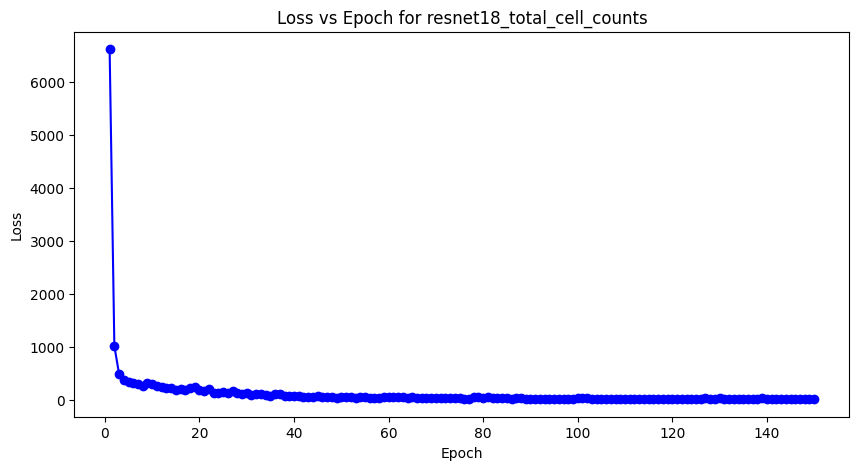

In [269]:
name = "resnet18_total_cell_counts"
# use resnet 18 to train the model

# define the hyper parameters
num_epochs = 150
batch_size = 16
learning_rate = 0.001

model = models.resnet18(pretrained=True) # load the pretrained resnet18 model, with pretrained weights

num_ftrs = model.fc.in_features # get the number of input features of the last layer
output_dim = 1 # define the output dimension
model.fc = nn.Linear(512,output_dim) # change the last layer of the model to a linear layer with 1 output
model = model.to(device) # move the model to the GPU

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=learning_rate)


# create data loaders
train_loader = DataLoader(TensorDataset(x_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
test_loader = DataLoader(TensorDataset(x_test_tensor, y_test_tensor), batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(TensorDataset(x_val_tensor, y_val_tensor), batch_size=batch_size, shuffle=True)


TrainingLoop(name,num_epochs,model,criterion,optimizer,train_loader,valid_loader)


Evaluating Training set


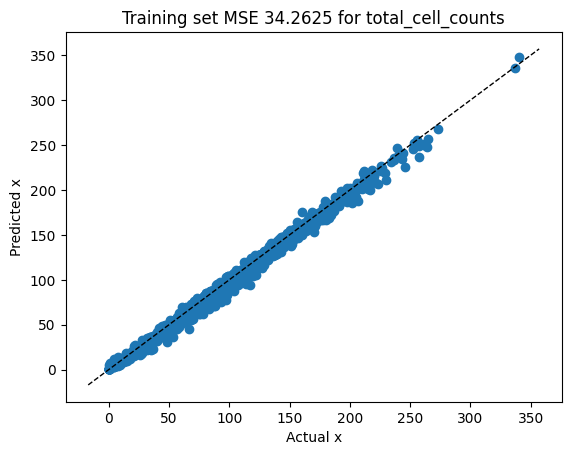

Evaluating Validation set


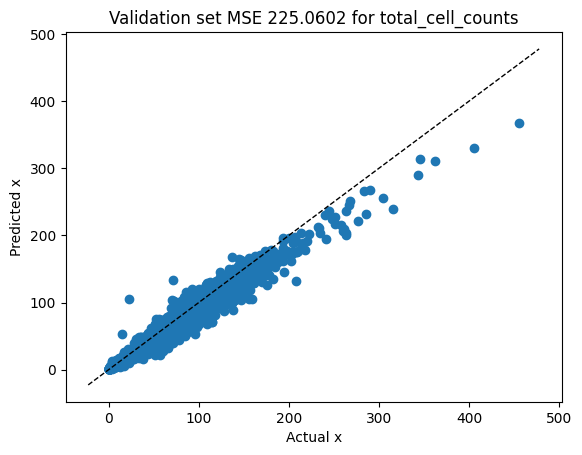

Evaluating Test set


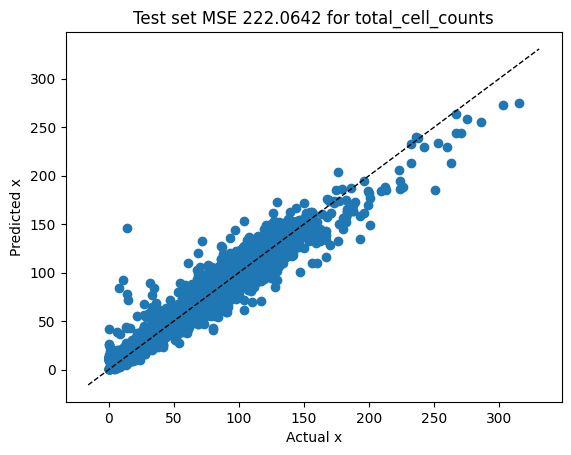

In [326]:
# Load saved model 
model = torch.load(f'models/{name}.pth')
model.eval()
model.to(device)


test_loader = DataLoader(TensorDataset(x_test_tensor, y_test_tensor), batch_size=batch_size, shuffle=True)

# Evaluate model on training and validation set
loaders = [train_loader,valid_loader,test_loader]
titles = ["Training","Validation","Test"]

# Evaluate on training and validation set
model_evaluation(model,loaders,titles,cell_label='total_cell_counts')

In [314]:
total_countsdf

,MSE,R2,RMS,Spearman,Pearson
Training,34.206892,0.986301,5.848666,0.995082,0.995982
Validation,224.5381,0.894869,14.984595,0.960361,0.968608
Test,222.144477,0.894341,14.904512,0.948212,0.953464
Train,34.329563,0.986301,5.859144,0.995082,0.995982


### Q3B

Method 
- Same model from above but for each cell type

c:\Users\burhan\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\burhan\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Training model:resnet18_neutrophil 
Epoch [1/150], Step [10/102], Loss: 7.9878
Epoch [1/150], Step [20/102], Loss: 4.0875
Epoch [1/150], Step [30/102], Loss: 2.0375
Epoch [1/150], Step [40/102], Loss: 1.2843
Epoch [1/150], Step [50/102], Loss: 59.0440
Epoch [1/150], Step [60/102], Loss: 6.4984
Epoch [1/150], Step [70/102], Loss: 10.2350
Epoch [1/150], Step [80/102], Loss: 1.0442
Epoch [1/150], Step [90/102], Loss: 6.9684
Epoch [1/150], Step [100/102], Loss: 0.9780
Validation loss:  7.7003303
saving model
Epoch [2/150], Step [10/102], Loss: 4.7807
Epoch [2/150], Step [20/102], Loss: 1.7739
Epoch [2/150], Step [30/102], Loss: 49.8542
Epoch [2/150], Step [40/102], Loss: 5.0127
Epoch [2/150], Step [50/102], Loss: 2.5769
Epoch [2/150], Step [60/102], Loss: 18.6111
Epoch [2/150], Step [70/102], Loss: 2.7280
Epoch [2/150], Step [80/102], Loss: 2.2355
Epoch [2/150], Step [90/102], Loss: 0.4752
Epoch [2/150], Step [100/102], Loss: 0.7564
Validation loss:  0.9282558
saving model
Epoch [3/150], S

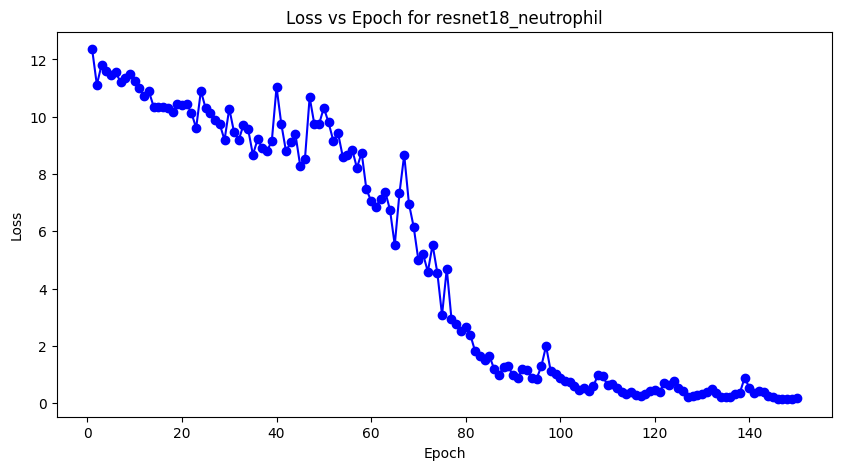

Training model:resnet18_epithelial 
Epoch [1/150], Step [10/102], Loss: 3456.8218
Epoch [1/150], Step [20/102], Loss: 1730.0366
Epoch [1/150], Step [30/102], Loss: 803.2691
Epoch [1/150], Step [40/102], Loss: 2012.9104
Epoch [1/150], Step [50/102], Loss: 750.1138
Epoch [1/150], Step [60/102], Loss: 442.3765
Epoch [1/150], Step [70/102], Loss: 880.0712
Epoch [1/150], Step [80/102], Loss: 1907.6052
Epoch [1/150], Step [90/102], Loss: 632.2124
Epoch [1/150], Step [100/102], Loss: 2843.1318
Validation loss:  760.8208
saving model
Epoch [2/150], Step [10/102], Loss: 358.8761
Epoch [2/150], Step [20/102], Loss: 1563.0211
Epoch [2/150], Step [30/102], Loss: 298.7112
Epoch [2/150], Step [40/102], Loss: 481.2483
Epoch [2/150], Step [50/102], Loss: 350.5162
Epoch [2/150], Step [60/102], Loss: 145.8239
Epoch [2/150], Step [70/102], Loss: 630.9166
Epoch [2/150], Step [80/102], Loss: 202.3885
Epoch [2/150], Step [90/102], Loss: 268.0405
Epoch [2/150], Step [100/102], Loss: 514.2956
Validation loss:

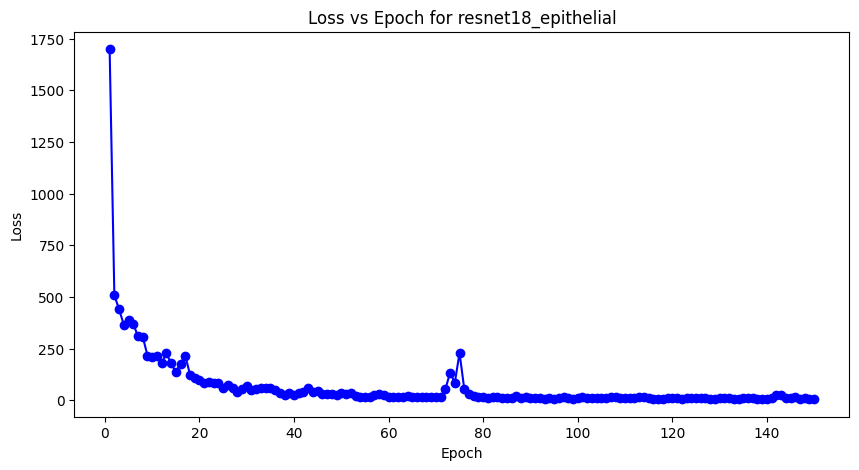

Training model:resnet18_lymphocyte 
Epoch [1/150], Step [10/102], Loss: 455.3851
Epoch [1/150], Step [20/102], Loss: 470.1945
Epoch [1/150], Step [30/102], Loss: 218.2814
Epoch [1/150], Step [40/102], Loss: 104.6986
Epoch [1/150], Step [50/102], Loss: 174.9328
Epoch [1/150], Step [60/102], Loss: 713.2860
Epoch [1/150], Step [70/102], Loss: 285.3097
Epoch [1/150], Step [80/102], Loss: 1179.7888
Epoch [1/150], Step [90/102], Loss: 158.8084
Epoch [1/150], Step [100/102], Loss: 800.2380
Validation loss:  111.500885
saving model
Epoch [2/150], Step [10/102], Loss: 161.5271
Epoch [2/150], Step [20/102], Loss: 154.0648
Epoch [2/150], Step [30/102], Loss: 1079.5220
Epoch [2/150], Step [40/102], Loss: 238.1440
Epoch [2/150], Step [50/102], Loss: 208.4959
Epoch [2/150], Step [60/102], Loss: 173.8958
Epoch [2/150], Step [70/102], Loss: 64.5168
Epoch [2/150], Step [80/102], Loss: 248.5896
Epoch [2/150], Step [90/102], Loss: 68.2792
Epoch [2/150], Step [100/102], Loss: 244.3096
Validation loss:  70

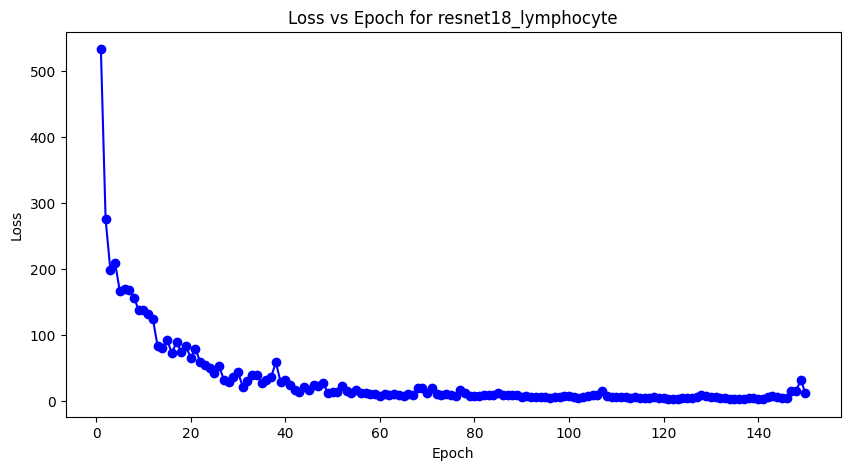

Training model:resnet18_plasma 
Epoch [1/150], Step [10/102], Loss: 31.9163
Epoch [1/150], Step [20/102], Loss: 49.7688
Epoch [1/150], Step [30/102], Loss: 29.6384
Epoch [1/150], Step [40/102], Loss: 27.4552
Epoch [1/150], Step [50/102], Loss: 13.7393
Epoch [1/150], Step [60/102], Loss: 14.0421
Epoch [1/150], Step [70/102], Loss: 21.1531
Epoch [1/150], Step [80/102], Loss: 39.1340
Epoch [1/150], Step [90/102], Loss: 66.1982
Epoch [1/150], Step [100/102], Loss: 84.1944
Validation loss:  277.25766
saving model
Epoch [2/150], Step [10/102], Loss: 17.0778
Epoch [2/150], Step [20/102], Loss: 85.7699
Epoch [2/150], Step [30/102], Loss: 27.5209
Epoch [2/150], Step [40/102], Loss: 25.0053
Epoch [2/150], Step [50/102], Loss: 15.4533
Epoch [2/150], Step [60/102], Loss: 50.5130
Epoch [2/150], Step [70/102], Loss: 60.9882
Epoch [2/150], Step [80/102], Loss: 54.3498
Epoch [2/150], Step [90/102], Loss: 20.2298
Epoch [2/150], Step [100/102], Loss: 35.8675
Validation loss:  54.686428
saving model
Epoc

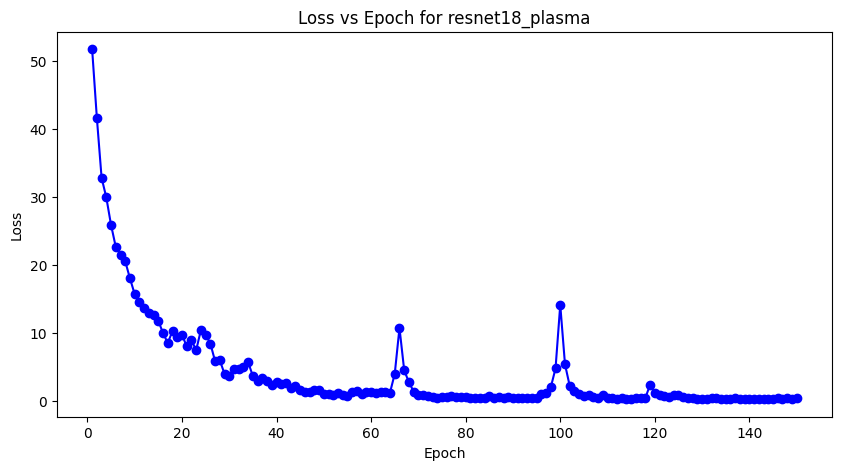

Training model:resnet18_eosinophil 
Epoch [1/150], Step [10/102], Loss: 3.5445
Epoch [1/150], Step [20/102], Loss: 1.3534
Epoch [1/150], Step [30/102], Loss: 4.1668
Epoch [1/150], Step [40/102], Loss: 0.6631
Epoch [1/150], Step [50/102], Loss: 1.5701
Epoch [1/150], Step [60/102], Loss: 0.3231
Epoch [1/150], Step [70/102], Loss: 1.1285
Epoch [1/150], Step [80/102], Loss: 3.7638
Epoch [1/150], Step [90/102], Loss: 0.8437
Epoch [1/150], Step [100/102], Loss: 0.8441
Validation loss:  3.976404
saving model
Epoch [2/150], Step [10/102], Loss: 0.4147
Epoch [2/150], Step [20/102], Loss: 0.7611
Epoch [2/150], Step [30/102], Loss: 0.5223
Epoch [2/150], Step [40/102], Loss: 0.4363
Epoch [2/150], Step [50/102], Loss: 0.4962
Epoch [2/150], Step [60/102], Loss: 2.3436
Epoch [2/150], Step [70/102], Loss: 1.8825
Epoch [2/150], Step [80/102], Loss: 0.6724
Epoch [2/150], Step [90/102], Loss: 0.4717
Epoch [2/150], Step [100/102], Loss: 0.9988
Validation loss:  1.3644781
saving model
Epoch [3/150], Step [

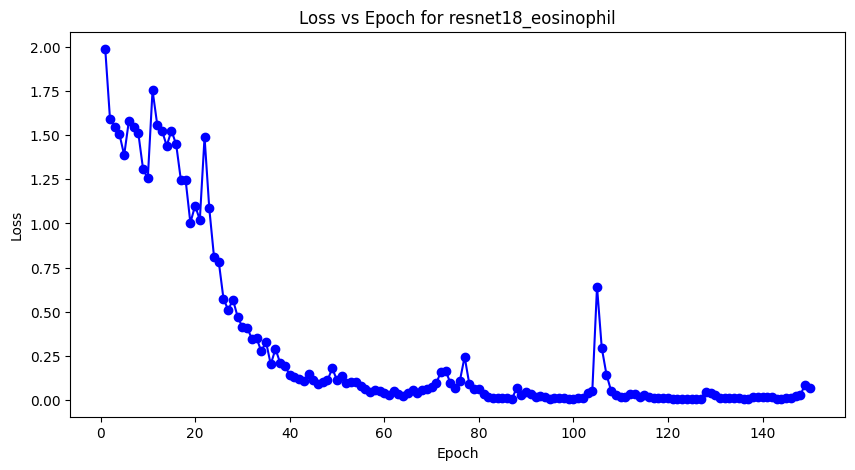

Training model:resnet18_connective 
Epoch [1/150], Step [10/102], Loss: 725.7877
Epoch [1/150], Step [20/102], Loss: 405.3863
Epoch [1/150], Step [30/102], Loss: 312.6698
Epoch [1/150], Step [40/102], Loss: 181.7941
Epoch [1/150], Step [50/102], Loss: 111.2735
Epoch [1/150], Step [60/102], Loss: 61.2586
Epoch [1/150], Step [70/102], Loss: 116.5826
Epoch [1/150], Step [80/102], Loss: 189.1510
Epoch [1/150], Step [90/102], Loss: 218.1129
Epoch [1/150], Step [100/102], Loss: 183.9731
Validation loss:  615.09644
saving model
Epoch [2/150], Step [10/102], Loss: 102.7350
Epoch [2/150], Step [20/102], Loss: 182.1854
Epoch [2/150], Step [30/102], Loss: 239.9988
Epoch [2/150], Step [40/102], Loss: 95.4026
Epoch [2/150], Step [50/102], Loss: 88.0160
Epoch [2/150], Step [60/102], Loss: 92.4289
Epoch [2/150], Step [70/102], Loss: 58.1818
Epoch [2/150], Step [80/102], Loss: 95.8824
Epoch [2/150], Step [90/102], Loss: 209.2077
Epoch [2/150], Step [100/102], Loss: 156.1214
Validation loss:  134.5233


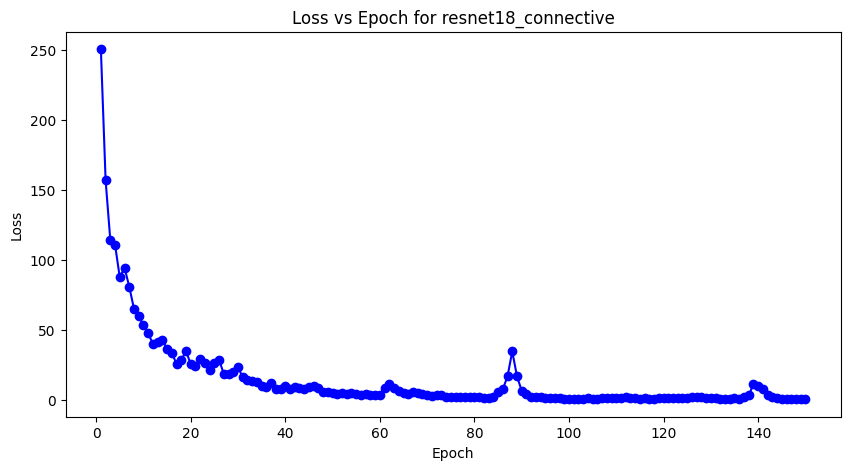

In [272]:
# define the hyperparameters
batch_size = 16
learning_rate = 0.001

num_epochs = 150



# Get all the columns names apart from the last one
cells = Y.columns[:-1]

for i,cell in enumerate(cells):
    # name of the model
    name = f"resnet18_{cell}"

    # define the model

    model = models.resnet18(pretrained=True) # load the pretrained resnet18 model, with pretrained weights
    num_ftrs = model.fc.in_features # get the number of input features of the last layer
    output_dim = 1 # define the output dimension
    model.fc = nn.Linear(num_ftrs,output_dim) # change the last layer of the model to a linear layer with 7 output
    model = model.to(device) # move the model to the GPU
    
        # define the loss function and the optimizer
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(),lr=learning_rate)
    #prepare the data
    # train data is F==1 and we want the cell column
    y_train = np.asarray(Y[F==1][cell])
    if y_train.sum() != (Y[F==1][cell]).sum():
        print("error in training")
        break

    # validation data is F==2 and we want the cell column
    y_valid = np.asarray(Y[F==2][cell])
    if y_valid.sum() != (Y[F==2][cell]).sum():
        print("error in validation")
        break

    # convert to tensor
    y_train_tensor = ((torch.from_numpy(np.asarray(y_train)).float()).unsqueeze(1)).to(device)
    y_valid_tensor = ((torch.from_numpy(np.asarray(y_valid)).float()).unsqueeze(1)).to(device)
    
    # print(y_train_tensor.shape)

    # create the data loader
    train_loader = DataLoader(TensorDataset(x_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
    valid_loader = DataLoader(TensorDataset(x_val_tensor, y_valid_tensor), batch_size=batch_size, shuffle=True)

    # train the model for the cell
    TrainingLoop(name,num_epochs,model,criterion,optimizer,train_loader,valid_loader)

    plt.show()
   


Evaluating Training set


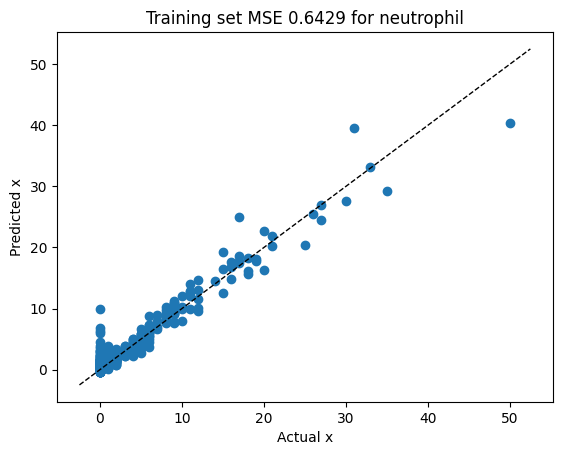

Evaluating Validation set


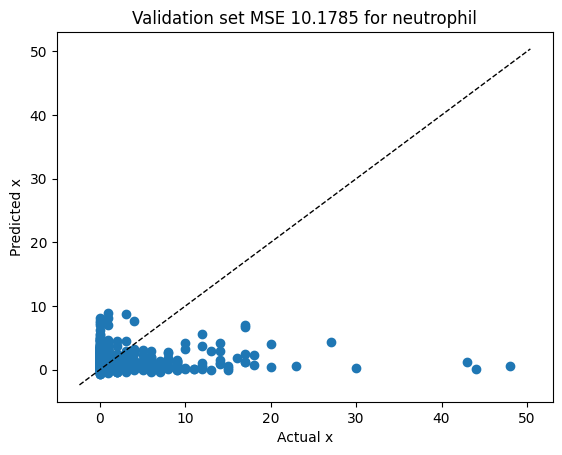

Evaluating Test set


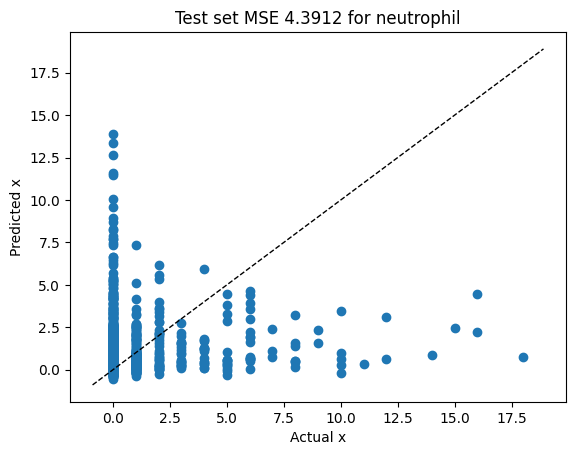

Evaluating Training set


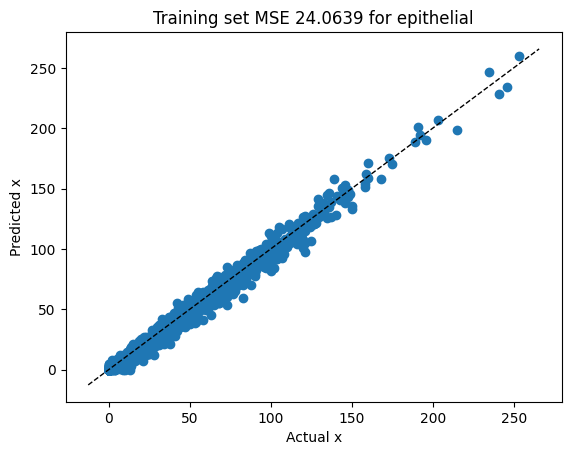

Evaluating Validation set


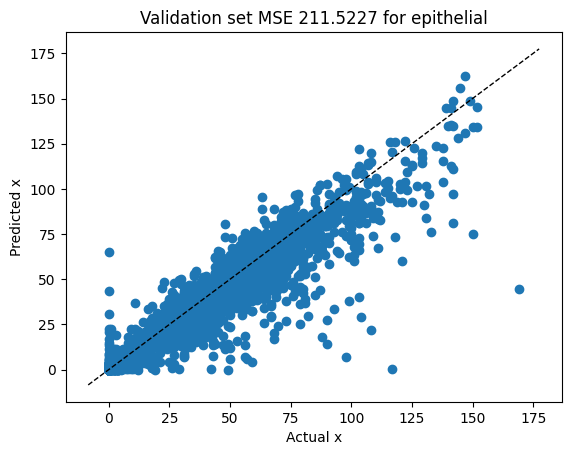

Evaluating Test set


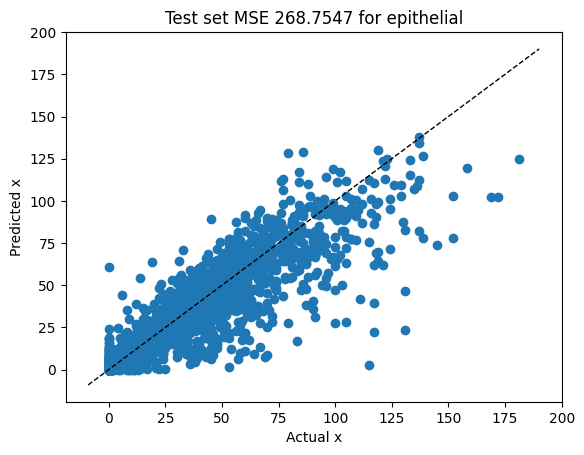

Evaluating Training set


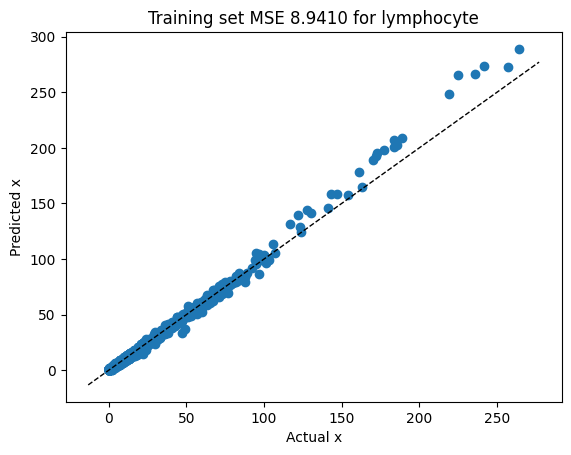

Evaluating Validation set


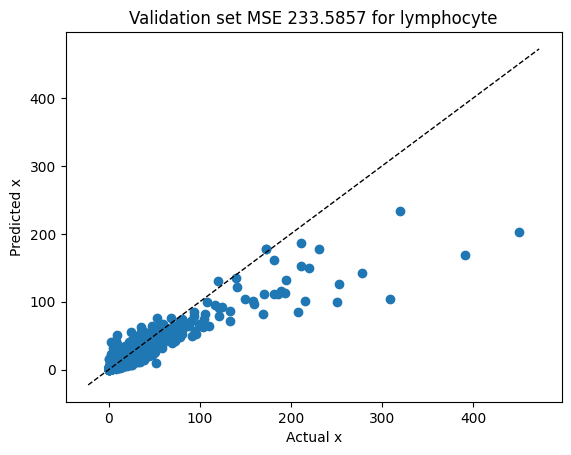

Evaluating Test set


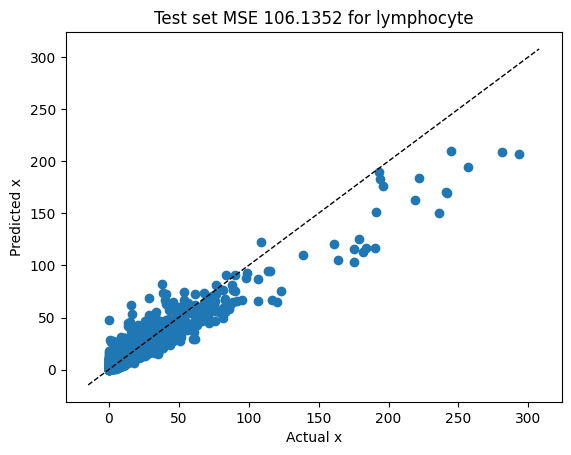

Evaluating Training set


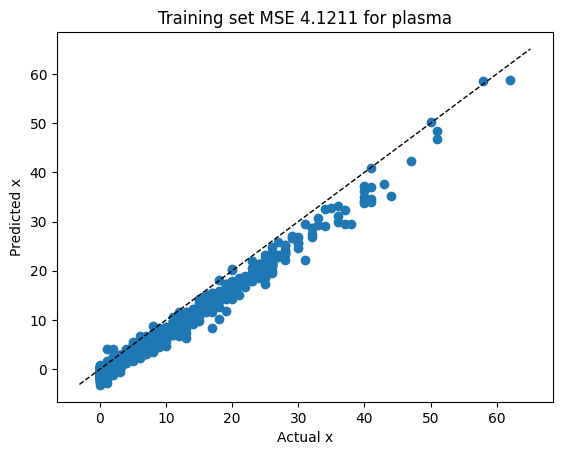

Evaluating Validation set


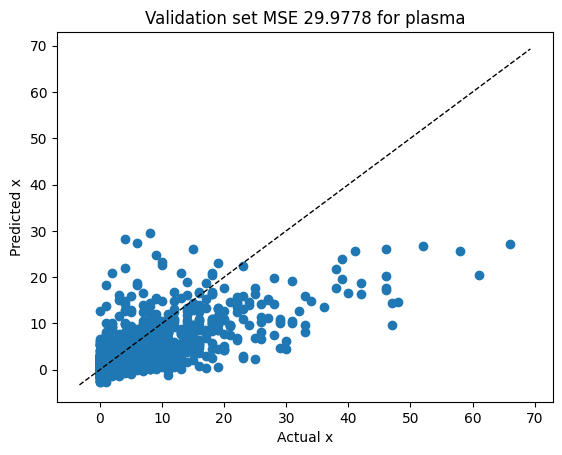

Evaluating Test set


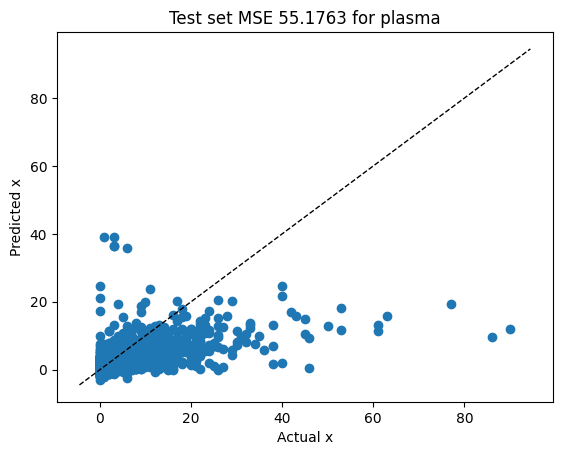

Evaluating Training set


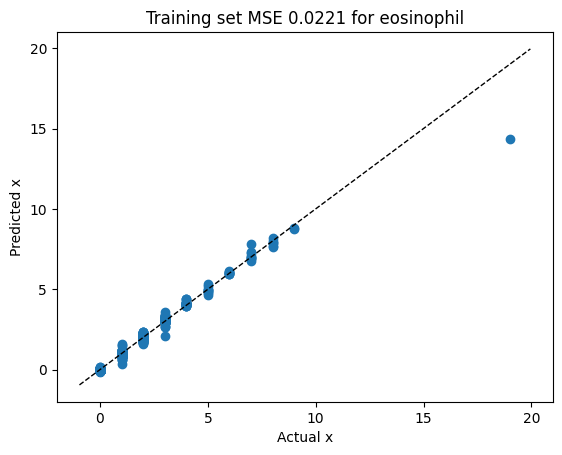

Evaluating Validation set


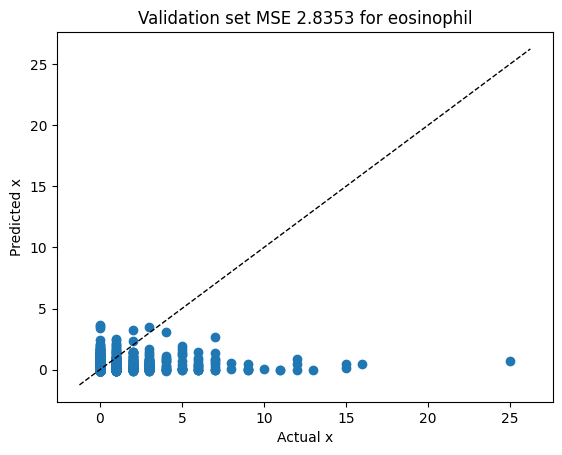

Evaluating Test set


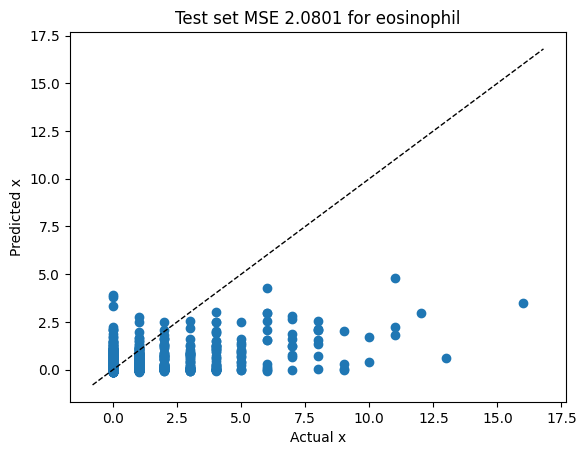

Evaluating Training set


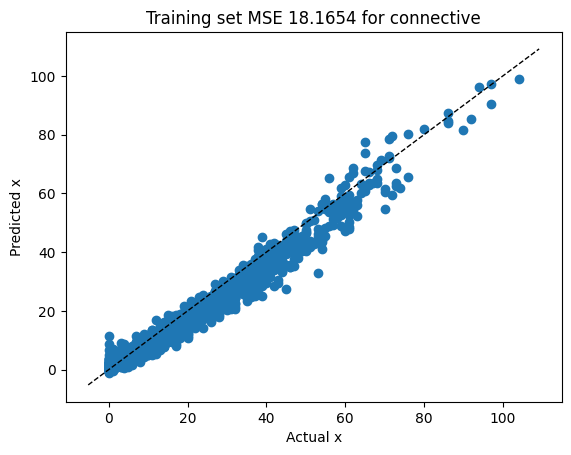

Evaluating Validation set


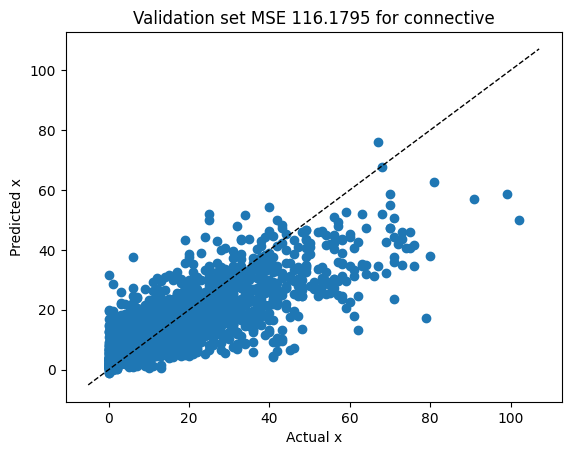

Evaluating Test set


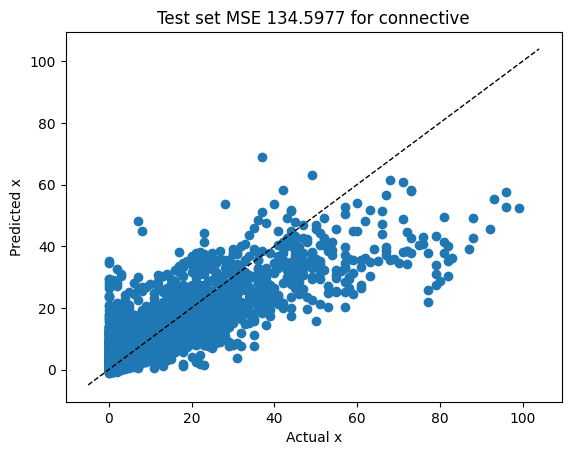

Evaluating Training set


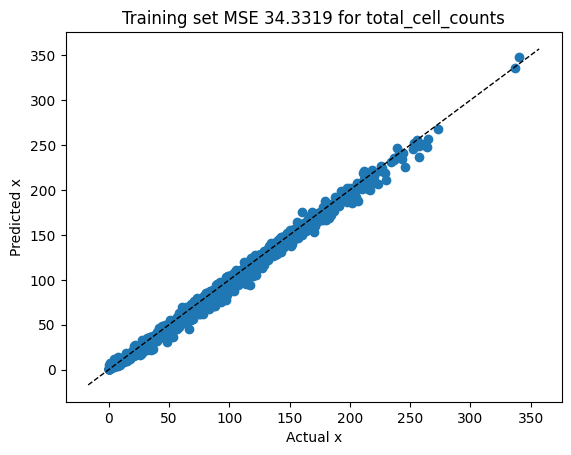

Evaluating Validation set


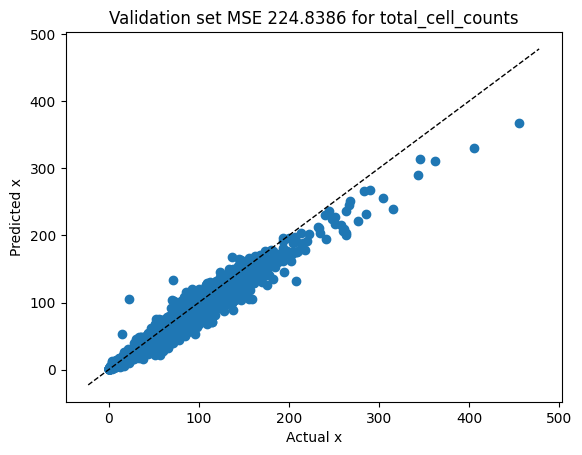

Evaluating Test set


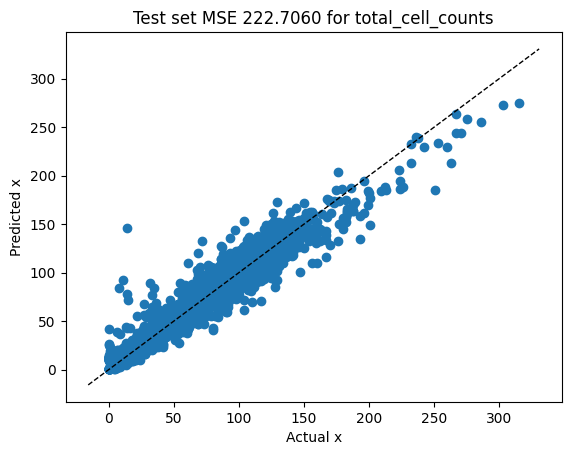

In [352]:
cells = Y.columns
for i,cell in enumerate(cells):
    # name of the model
    name = f"resnet18_{cell}"
  

    # Load saved model 
    model = torch.load(f'models/{name}.pth')
    model.eval()
    model.to(device)
     #prepare the data
    # train data is F==1 and we want the cell column
    y_train = np.asarray(Y[F==1][cell])
    # validation data is F==2 and we want the cell column
    y_valid = np.asarray(Y[F==2][cell])
    
    #get the test data
    y_test = np.asarray(Y[F==3][cell])
    


    # convert to tensor
    y_train_tensor = torch.from_numpy(np.asarray(y_train)).float()
    y_valid_tensor = torch.from_numpy(np.asarray(y_valid)).float()
    y_test_tensor = torch.from_numpy(np.asarray(y_test)).float()

    # create the data loader
    # Create new loader for all data
    train_loader = DataLoader(TensorDataset(x_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
    valid_loader = DataLoader(TensorDataset(x_val_tensor, y_valid_tensor), batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(TensorDataset(x_test_tensor, y_test_tensor), batch_size=batch_size, shuffle=True)

    # Evaluate model on all sets
    loaders = [train_loader,valid_loader,test_loader]
    titles = ["Training","Validation","Test"]
    model_evaluation(model,loaders,titles,cell_label=cell)

In [353]:
train_resultsdf

,MSE,R2,RMS,Spearman,Pearson
neutrophil,0.642906,0.944348,0.801814,0.654693,0.974648
epithelial,24.063886,0.982939,4.905495,0.990778,0.992636
lymphocyte,8.941041,0.990577,2.990157,0.995246,0.996575
plasma,4.121122,0.921838,2.030055,0.953814,0.991363
eosinophil,0.022094,0.987198,0.148641,0.783096,0.993799
connective,18.165424,0.92829,4.262091,0.983903,0.982546
total_cell_counts,NaN,NaN,NaN,NaN,NaN


In [354]:
# add the total cell counts to the dataframe
train_resultsdf.loc['total_cell_counts'] = total_countsdf.loc['Training']
validation_resultsdf.loc['total_cell_counts'] = total_countsdf.loc['Validation']
test_resultsdf.loc['total_cell_counts'] = total_countsdf.loc['Test']

Training results for final model

In [355]:
train_resultsdf

,MSE,R2,RMS,Spearman,Pearson
neutrophil,0.642906,0.944348,0.801814,0.654693,0.974648
epithelial,24.063886,0.982939,4.905495,0.990778,0.992636
lymphocyte,8.941041,0.990577,2.990157,0.995246,0.996575
plasma,4.121122,0.921838,2.030055,0.953814,0.991363
eosinophil,0.022094,0.987198,0.148641,0.783096,0.993799
connective,18.165424,0.92829,4.262091,0.983903,0.982546
total_cell_counts,34.331863,0.986301,5.85934,0.995082,0.995982


Validation results for final model

In [356]:
validation_resultsdf

,MSE,R2,RMS,Spearman,Pearson
neutrophil,10.178486,-8.617212,3.190374,0.171368,0.140811
epithelial,211.522714,0.777472,14.54382,0.915909,0.912583
lymphocyte,233.585692,0.525269,15.28351,0.921782,0.922312
plasma,29.977779,-0.32175,5.475197,0.73307,0.731752
eosinophil,2.835301,-14.976425,1.683835,0.295587,0.188874
connective,116.179471,0.075208,10.778658,0.75656,0.769799
total_cell_counts,224.838565,0.894869,14.994618,0.960361,0.968608


Test results for final model

In [357]:
test_resultsdf

,MSE,R2,RMS,Spearman,Pearson
neutrophil,4.391217,-1.240146,2.095523,0.146269,0.096168
epithelial,268.754746,0.718445,16.393741,0.905291,0.883135
lymphocyte,106.135209,0.806862,10.302194,0.907114,0.949686
plasma,55.176347,-1.951759,7.428078,0.685811,0.576213
eosinophil,2.080113,-6.692764,1.44226,0.39076,0.52333
connective,134.597653,0.099337,11.601623,0.775916,0.778744
total_cell_counts,222.705981,0.894341,14.923337,0.948212,0.953464
